<div style="width: 76ch;">
<h3>Achtstangen-mechanisme (Paraplu): Python code</h3>

<p>Animatie van een achtstaaf-mechanisme dat werkt als een paraplu.<br>
Gebaseerd op het algoritme voor het vierstangenmechanisme (F. Ulloa Roas, H. Bruyninckx).</p>

<h4>Structuur</h4>
<table border='1' cellpadding='4'>
<tr><th>Stang</th><th>Punten (van → naar)</th><th>Lengte (× L1)</th><th>Draaipunt</th></tr>
<tr><td>1 (schuifbaan)</td><td>verticale y-as</td><td>L1 = 1.0</td><td>—</td></tr>
<tr><td>2 (schuifgewricht)</td><td>B langs stang 1</td><td>—</td><td>—</td></tr>
<tr><td>3 = 3a + 3b</td><td>B → D → E</td><td>0.275 + 0.0875</td><td>B (tgw.wijzers)</td></tr>
<tr><td>4 = 4a + 4b</td><td>C → E (4a) → H (4b) &nbsp;<em>rechte stang</em></td><td>0.35 + 0.25</td><td>C (vast)</td></tr>
<tr><td>5 = 5a + 5b</td><td>D → F → G</td><td>0.19375 + 0.075</td><td>D (mee-tgw.)</td></tr>
<tr><td>6</td><td>F → I</td><td>0.28125</td><td>F (tgw.wijzers)</td></tr>
<tr><td>7 = 7a + 7b</td><td>G → H → J</td><td>0.075 + 0.20625</td><td>G (tgw.wijzers)</td></tr>
<tr><td>8 = 8a + 8b</td><td>I → J → K</td><td>0.0625 + 0.2375</td><td>I (tgw.wijzers)</td></tr>
</table>

<h4>Koppelpunten</h4>
<ul>
<li><b>H</b> — ligt op stang 4 (C–E–H) ÉN op stang 7 (G–H–J)</li>
<li><b>I</b> — koppelpunt van stang 6 (F→I) en draaipunt van stang 8 (I–J–K)</li>
<li><b>J</b> — koppelpunt van stang 7 (G–H–J) en stang 8 (I–J–K)</li>
</ul>

<h4>Lus-sluitingsvergelijkingen</h4>
<p><b>Lus 1</b> — stangen 3, 4, schuifbaan:<br>
B + L3_total · u(θ₃) = C + L4a · u(θ₄)<br>
→ 2 vgl., 2 onbekenden: <em>θ₃, θ₄</em><br>
Hieruit volgt ook: H = C + L4_total · u(θ₄)</p>

<p><b>Lus 2</b> — stangen 5, 7a (koppeling via H):<br>
D + L5_total · u(θ₅) + L7a · u(θ₇) = H<br>
→ 2 vgl., 2 onbekenden: <em>θ₅, θ₇</em></p>

<p><b>Lus 3</b> — stangen 6, 8a (koppeling via I):<br>
F + L6 · u(θ₆) = J − L8a · u(θ₈)<br>
waarbij F = D + L5a · u(θ₅) en J = G + L7_total · u(θ₇) al bekend zijn<br>
→ 2 vgl., 2 onbekenden: <em>θ₆, θ₈</em></p>
</div>

In [344]:
# ── Imports ───────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

%matplotlib inline

C = [0. 2.]
B_y bereik: [1.015, 1.900] m  (slag = 0.885 m)
T_half = 7.5 s  |  max snelheid B: 0.2213 m/s
max versnelling B: 0.0908 m/s²


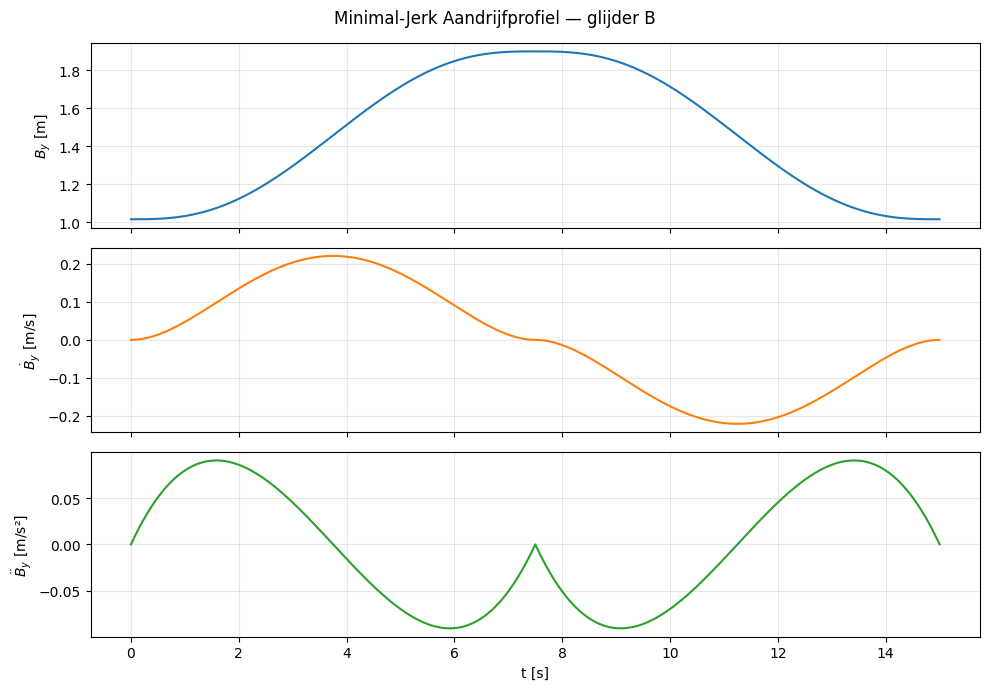

In [345]:
# ── Afmetingen [m] ────────────────────────────────────────────────────────────
L1 = 2.0

L3a, L3b = 0.4 , 0.1 
L4a, L4b = 0.5    , 0.5  
L5a, L5b = 0.4 , L3b
L6        = 0.4 
L7a, L7b = 0.1  , 0.3 
L8a, L8b = L3b, 0.2375  

L3_total = L3a + L3b
L4_total = L4a + L4b
L5_total = L5a + L5b
L7_total = L7a + L7b
L8_total = L8a + L8b



# ── Vast draaipunt ────────────────────────────────────────────────────────────
# C: enig vast draaipunt, bovenaan de schuifbaan (y-as).
# De schuifbeweging van B gebruikt B_y ∈ [0.20, 0.50],
# zodat |CB| ∈ [0.25, 0.55] — ruim binnen het haalbare bereik
# [|L3_total − L4a|, L3_total + L4a] = [0.0125, 0.7125].
C = np.array([0.0, L1])

# ── Tijdsinstelling ───────────────────────────────────────────────────────────
t_begin = 0.0
t_end   = 15.0    # 2 × T_half (heen en terug): één volledige cyclus
Ts      = 0.01   # tijdstap [s] — verfijnd t.o.v. de sinusoïdale versie
t = np.arange(t_begin, t_end + Ts, Ts)
N = len(t)

# ── Aandrijving: minimaal-ruk (quintic) profiel ───────────────────────────────
#
# In plaats van een sinusoïde (constante amplitude, oneindige beweging) gebruiken
# we een quintic (5e-graads) polynoom dat:
#   - start en eindigt met nul snelheid en nul versnelling  (→ C²-continu)
#   - de ruk (3e afgeleide) minimaliseert in een kwadratieken zin
#   - een eindige, realistisch heen-en-terug beweging beschrijft
#
# De normaliseerde tijdsvariabele τ = t / T_half loopt van 0 naar 1.
# Het "heen"-deel (τ ∈ [0,1]):
#   B_y(τ) = B_y_start + ΔB_y · (10τ³ − 15τ⁴ + 6τ⁵)
#   dB_y/dt = (ΔB_y / T_half) · (30τ² − 60τ³ + 30τ⁴)
#   d²B_y/dt² = (ΔB_y / T_half²) · (60τ − 180τ² + 120τ³)
#
# Het "terug"-deel (τ' = (t − T_half) / T_half ∈ [0,1]) is gespiegeld.
#
# Referentie: Flash & Hogan (1985), "The coordination of arm movements:
#   an experimentally confirmed mathematical model", J. Neurosci. 5(7).

B_y_start = 0.015 + 1  # startpositie (glijder volledig ingeschoven)
B_y_end   = 0.90  + 1 # eindpositie  (glijder volledig uitgeschoven)
delta_By  = B_y_end - B_y_start  # totale slag (positief = omhoog)
T_half    = t_end / 2            # tijd voor één enkele slag [s]

def quintic_out_and_back(t, y_start, delta_y, T_half):
    """
    Quintic (minimaal-ruk) heen-en-terug profiel voor de glijder.

    Parameters
    ----------
    t       : tijdsvector [s]
    y_start : startpositie [m]
    delta_y : slaglengte (positief = omhoog) [m]
    T_half  : tijdsduur van één slag [s]

    Returns
    -------
    y, dy, ddy : positie [m], snelheid [m/s], versnelling [m/s²]
    """
    y   = np.full_like(t, y_start, dtype=float)
    dy  = np.zeros_like(t, dtype=float)
    ddy = np.zeros_like(t, dtype=float)

    # Heen-slag: t ∈ [0, T_half]
    mask1 = (t >= 0) & (t <= T_half)
    tau   = t[mask1] / T_half
    y  [mask1] = y_start + delta_y * (10*tau**3 - 15*tau**4 + 6*tau**5)
    dy [mask1] = (delta_y / T_half) * (30*tau**2 - 60*tau**3 + 30*tau**4)
    ddy[mask1] = (delta_y / T_half**2) * (60*tau - 180*tau**2 + 120*tau**3)

    # Terug-slag: t ∈ (T_half, 2·T_half]
    mask2 = (t > T_half) & (t <= 2*T_half)
    tau2  = (t[mask2] - T_half) / T_half
    y  [mask2] = (y_start + delta_y) - delta_y * (10*tau2**3 - 15*tau2**4 + 6*tau2**5)
    dy [mask2] = -(delta_y / T_half) * (30*tau2**2 - 60*tau2**3 + 30*tau2**4)
    ddy[mask2] = -(delta_y / T_half**2) * (60*tau2 - 180*tau2**2 + 120*tau2**3)

    return y, dy, ddy

B_y, dB_y, ddB_y = quintic_out_and_back(t, B_y_start, delta_By, T_half)

print(f"C = {C}")
print(f"B_y bereik: [{B_y.min():.3f}, {B_y.max():.3f}] m  (slag = {delta_By:.3f} m)")
print(f"T_half = {T_half:.1f} s  |  max snelheid B: {dB_y.max():.4f} m/s")
print(f"max versnelling B: {ddB_y.max():.4f} m/s²")

# Visualisatie van het aandrijfprofiel
import matplotlib.pyplot as plt
fig_drv, axes_drv = plt.subplots(3, 1, figsize=(10, 7), sharex=True)
fig_drv.suptitle('Minimal-Jerk Aandrijfprofiel — glijder B')
axes_drv[0].plot(t, B_y,   color='tab:blue')
axes_drv[0].set_ylabel('$B_y$ [m]')
axes_drv[0].grid(True, alpha=0.3)
axes_drv[1].plot(t, dB_y,  color='tab:orange')
axes_drv[1].set_ylabel(r'$\dot{B}_y$ [m/s]')
axes_drv[1].grid(True, alpha=0.3)
axes_drv[2].plot(t, ddB_y, color='tab:green')
axes_drv[2].set_ylabel(r'$\ddot{B}_y$ [m/s²]')
axes_drv[2].set_xlabel('t [s]')
axes_drv[2].grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [346]:
# ── Hulpfuncties ──────────────────────────────────────────────────────────────

def unit(theta):
    """Eenheidsvector in richting theta [rad]."""
    return np.array([np.cos(theta), np.sin(theta)])

def rotate_vector(v, theta):
    """Roteer 2D-vector v over hoek theta [rad]."""
    c, s = np.cos(theta), np.sin(theta)
    return np.array([[c, -s], [s, c]]) @ v

In [347]:
# ── Lus-sluitingsfuncties ─────────────────────────────────────────────────────

def lus1_eqs(thetas, B):
    """
    Lus 1 — stangen 3, 4 en schuifbaan:
      B + L3_total · u(θ₃)  =  C + L4a · u(θ₄)    [punt E]
    Onbekenden: [θ₃, θ₄]
    Afgeleide grootheden:
      D = B + L3a · u(θ₃)
      E = B + L3_total · u(θ₃)  (= C + L4a · u(θ₄))
      H = C + L4_total · u(θ₄)   ← H ligt op de RECHTE stang 4 (C–E–H)
    """
    theta3, theta4 = thetas
    F1 = B[0] + L3_total * np.cos(theta3) - C[0] - L4a * np.cos(theta4)
    F2 = B[1] + L3_total * np.sin(theta3) - C[1] - L4a * np.sin(theta4)
    return [F1, F2]


def lus2_eqs(thetas, D, H):
    """
    Lus 2 — stangen 5 en 7a, koppeling via H:
      D + L5_total · u(θ₅) + L7a · u(θ₇)  =  H
    Onbekenden: [θ₅, θ₇]
    Afgeleide grootheden:
      F = D + L5a · u(θ₅)
      G = D + L5_total · u(θ₅)
      J = G + L7_total · u(θ₇)   (= G + (L7a+L7b) · u(θ₇))
    """
    theta5, theta7 = thetas
    G  = D + L5_total * unit(theta5)
    Hc = G + L7a      * unit(theta7)
    return [Hc[0] - H[0], Hc[1] - H[1]]


def lus3_eqs(thetas, F, J):
    """
    Lus 3 — stangen 6 en 8a, koppeling via I:
      F + L6 · u(θ₆)  =  J − L8a · u(θ₈)    [punt I]
    Onbekenden: [θ₆, θ₈]
    Afgeleide grootheden:
      I = F + L6 · u(θ₆)
      K = I + L8_total · u(θ₈)  (= I + (L8a+L8b) · u(θ₈))
    """
    theta6, theta8 = thetas
    I_via_F = F + L6  * unit(theta6)
    I_via_J = J - L8a * unit(theta8)
    return [I_via_F[0] - I_via_J[0], I_via_F[1] - I_via_J[1]]

In [348]:
# ── Positie-analyse: numerieke tijdsintegratie ────────────────────────────────

theta3 = np.zeros(N)
theta4 = np.zeros(N)
theta5 = np.zeros(N)
theta6 = np.zeros(N)
theta7 = np.zeros(N)
theta8 = np.zeros(N)

# Startschattingen VAN DE HOEKEN — bepaald uit geometrische analyse bij B_y = 0.35
t3_prev = np.radians(85.0)
t4_prev = np.radians(275.0)
t5_prev = np.radians(275.0)
t7_prev = np.radians(85.0)
t6_prev = np.radians(85.0)
t8_prev = np.radians(275.0)   # ≈ −151° (stang 8 wijst naar links-omlaag)
# t4(~330), t3(~210), t5(~350), t7(~45), t6(~45), t8(~350)

optim_options = {"full_output": True}

for k in range(N):
    B_k = np.array([0.0, B_y[k]])

    # ── Lus 1: θ₃ en θ₄ ──────────────────────────────────────────────────────
    x1, _, ier1, msg1 = fsolve(
        lus1_eqs, [t3_prev, t4_prev], args=(B_k,), **optim_options
    )
    if ier1 != 1:
        print(f"k={k}: Lus 1 geen convergentie — {msg1}")
    theta3[k], theta4[k] = x1

    

    D_k = B_k + L3a      * unit(theta3[k])
    H_k = C   + L4_total * unit(theta4[k])   # H op rechte stang 4

    # ── Lus 2: θ₅ en θ₇ ──────────────────────────────────────────────────────
    x2, _, ier2, msg2 = fsolve(
        lus2_eqs, [t5_prev, t7_prev], args=(D_k, H_k), **optim_options
    )
    if ier2 != 1:
        print(f"k={k}: Lus 2 geen convergentie — {msg2}")
    theta5[k], theta7[k] = x2

    F_k = D_k + L5a      * unit(theta5[k])
    G_k = D_k + L5_total * unit(theta5[k])
    J_k = G_k + L7_total * unit(theta7[k])

    # ── Lus 3: θ₆ en θ₈ ──────────────────────────────────────────────────────
    x3, _, ier3, msg3 = fsolve(
        lus3_eqs, [t6_prev, t8_prev], args=(F_k, J_k), **optim_options
    )
    if ier3 != 1:
        print(f"k={k}: Lus 3 geen convergentie — {msg3}")
    theta6[k], theta8[k] = x3

    # Warm starten voor de volgende tijdstap
    t3_prev, t4_prev = theta3[k], theta4[k]
    t5_prev, t7_prev = theta5[k], theta7[k]
    t6_prev, t8_prev = theta6[k], theta8[k]

print("Positie-analyse voltooid.")
print("Hoekbereiken [°]:")
for name, arr in [("θ₃",theta3),("θ₄",theta4),("θ₅",theta5),
                   ("θ₆",theta6),("θ₇",theta7),("θ₈",theta8)]:
    print(f"  {name}: [{np.degrees(arr.min()):+.1f}°, {np.degrees(arr.max()):+.1f}°]")

Positie-analyse voltooid.
Hoekbereiken [°]:
  θ₃: [+5.7°, +80.1°]
  θ₄: [+279.9°, +354.3°]
  θ₅: [+279.9°, +354.3°]
  θ₆: [+5.7°, +80.1°]
  θ₇: [+5.7°, +80.1°]
  θ₈: [+279.9°, +354.3°]


In [349]:
# ── Cartesische coördinaten van alle koppelpunten ─────────────────────────────
# Hierboven zijn alle onbekende hoeken gevonden en de posities van enkele punten, nu zullen we in het net alle punten
#bepalen + een verificatie van de lus-sluitingen opstellen
pts = {name: np.zeros((N, 2)) for name in ['B','D','E','F','G','H','I','J','K']}

for k in range(N):
    B_k = np.array([0.0, B_y[k]])
    D_k = B_k + L3a      * unit(theta3[k])
    E_k = B_k + L3_total * unit(theta3[k])
    F_k = D_k + L5a      * unit(theta5[k])
    G_k = D_k + L5_total * unit(theta5[k])
    H_k = C   + L4_total * unit(theta4[k])
    J_k = G_k + L7_total * unit(theta7[k])
    I_k = F_k + L6       * unit(theta6[k])
    K_k = I_k + L8_total * unit(theta8[k])

    pts['B'][k] = B_k
    pts['D'][k] = D_k
    pts['E'][k] = E_k
    pts['F'][k] = F_k
    pts['G'][k] = G_k
    pts['H'][k] = H_k
    pts['I'][k] = I_k
    pts['J'][k] = J_k
    pts['K'][k] = K_k

# ── Verificatie lus-sluitingen ────────────────────────────────────────────────
E_via_t4 = C + L4a * np.column_stack([np.cos(theta4), np.sin(theta4)])
H_via_t3_t5_t7 = pts['G'] + L7a * np.column_stack([np.cos(theta7), np.sin(theta7)])
I_via_J  = pts['J'] - L8a * np.column_stack([np.cos(theta8), np.sin(theta8)])

err1 = np.max(np.linalg.norm(pts['E'] - E_via_t4,        axis=1))
err2 = np.max(np.linalg.norm(pts['H'] - H_via_t3_t5_t7,  axis=1))
err3 = np.max(np.linalg.norm(pts['I'] - I_via_J,         axis=1))

print("Maximale lus-sluitingsfout:")
print(f"  Lus 1  (E via θ₄):        {err1:.2e} m")
print(f"  Lus 2  (H via θ₅,θ₇):     {err2:.2e} m")
print(f"  Lus 3  (I via J−L8a·u₈):  {err3:.2e} m")

Maximale lus-sluitingsfout:
  Lus 1  (E via θ₄):        1.46e-12 m
  Lus 2  (H via θ₅,θ₇):     1.00e-11 m
  Lus 3  (I via J−L8a·u₈):  8.48e-12 m


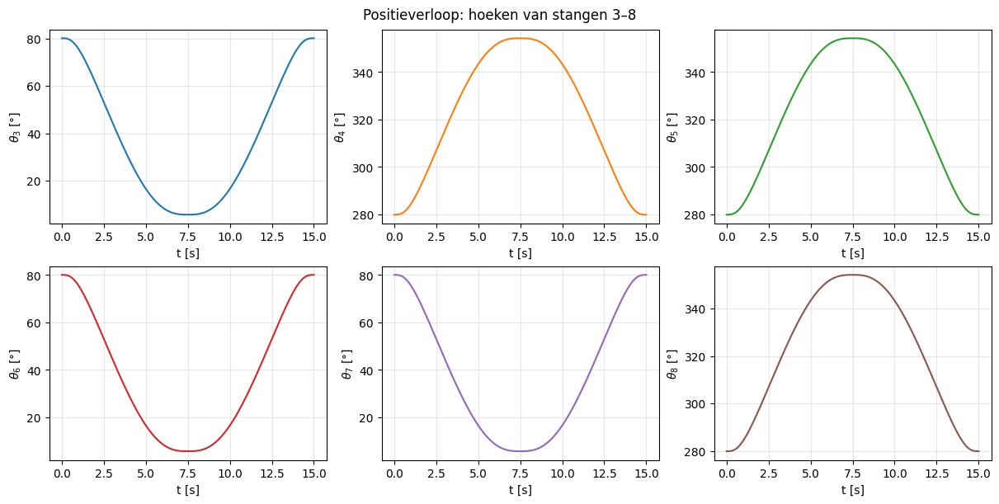

In [350]:
# ── Hoeken over de tijd plotten ───────────────────────────────────────────────
plt.close('all')
fig1, axes = plt.subplots(2, 3, constrained_layout=True, figsize=(12, 6))
fig1.suptitle("Positieverloop: hoeken van stangen 3–8")

plot_data = [
    (theta3, r'$\theta_3$ [°]', 'tab:blue'),
    (theta4, r'$\theta_4$ [°]', 'tab:orange'),
    (theta5, r'$\theta_5$ [°]', 'tab:green'),
    (theta6, r'$\theta_6$ [°]', 'tab:red'),
    (theta7, r'$\theta_7$ [°]', 'tab:purple'),
    (theta8, r'$\theta_8$ [°]', 'tab:brown'),
]

for ax, (th, label, color) in zip(axes.flat, plot_data):
    ax.plot(t, np.degrees(th), color=color)
    ax.set_ylabel(label)
    ax.set_xlabel('t [s]')
    ax.grid(True, alpha=0.3)
plt.show()


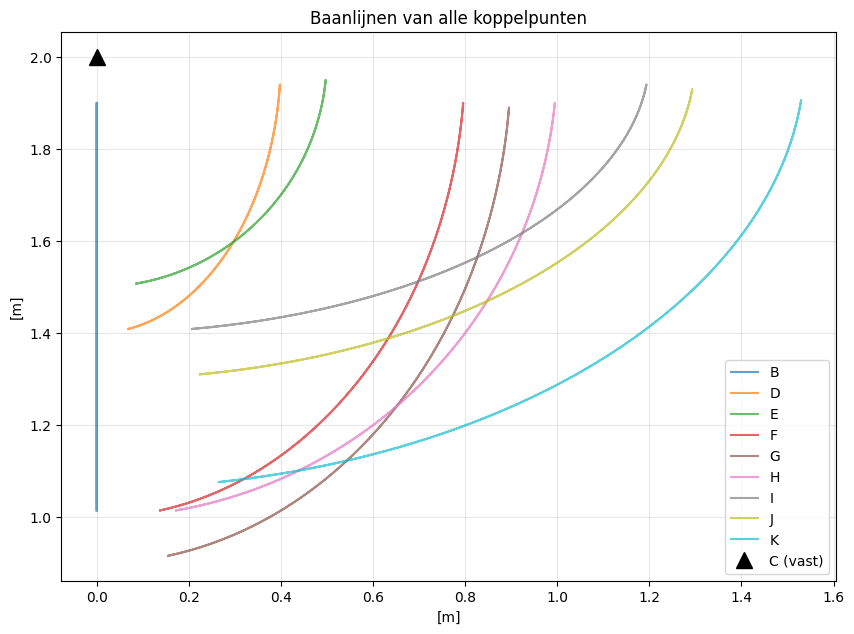

In [351]:
plt.close('all')  # sluit oude figuren eerst
# ── Baanlijnen van alle koppelpunten ──────────────────────────────────────────

fig2, ax2 = plt.subplots(figsize=(10, 8))
ax2.set_aspect('equal')
ax2.set_title('Baanlijnen van alle koppelpunten')
ax2.set_xlabel('[m]')
ax2.set_ylabel('[m]')
ax2.grid(True, alpha=0.3)

colors = plt.cm.tab10(np.linspace(0, 1, len(pts)))
for (name, traj), color in zip(pts.items(), colors):
    ax2.plot(traj[:, 0], traj[:, 1], '-', label=name, color=color, alpha=0.7, lw=1.5)

ax2.plot(*C, 'k^', ms=12, zorder=5, label='C (vast)')
ax2.legend(loc= 'lower right', fontsize=10)
plt.show()

In [352]:
# ── Snelheidsanalyse ──────────────────────────────────────────────────────────

def normal(theta):
    """Vector loodrecht op unit(theta): d(unit)/dtheta = normal(theta)."""
    return np.array([-np.sin(theta), np.cos(theta)])

omega3 = np.zeros(N)
omega4 = np.zeros(N)
omega5 = np.zeros(N)
omega6 = np.zeros(N)
omega7 = np.zeros(N)
omega8 = np.zeros(N)

cond_v1 = np.zeros(N) #(om condition number van de matrices te monitoren)
cond_v2 = np.zeros(N)
cond_v3 = np.zeros(N)

v_pts = {name: np.zeros((N, 2)) for name in ['B','D','E','F','G','H','I','J','K']}

for k in range(N):
    vB = np.array([0.0, dB_y[k]]) # Snelheid van B is bekend (aangedreven snelheid)

    u3 = unit(theta3[k])
    u4 = unit(theta4[k])
    u5 = unit(theta5[k])
    u6 = unit(theta6[k])
    u7 = unit(theta7[k])
    u8 = unit(theta8[k])   

    #de tijdsafgeleiden van de eenheidsvector van de bekende hoeken 
    n3 = normal(theta3[k])
    n4 = normal(theta4[k])
    n5 = normal(theta5[k])
    n6 = normal(theta6[k])
    n7 = normal(theta7[k])
    n8 = normal(theta8[k])

    # # Bekende punten uit de positie-analyse
    # D_k = pts['D'][k]
    # F_k = pts['F'][k]
    # G_k = pts['G'][k]
    # J_k = pts['J'][k]

    #Sluitingvergelijkingen in differentievorm uitrekenen

    # ── Lus 1: v_B + L3_total*ω3*n3 = L4a*ω4*n4 ───────────────────────────
    A1 = np.column_stack((L3_total * n3, -L4a * n4))
    b1 = -vB
    x1 = np.linalg.solve(A1, b1)
    omega3[k], omega4[k] = x1
    cond_v1[k] = np.linalg.cond(A1)

    # Snelheden van punten op stangen 3 en 4
    vD = vB + L3a      * omega3[k] * n3
    vE = vB + L3_total * omega3[k] * n3
    vH =      L4_total * omega4[k] * n4

    # ── Lus 2: v_D + L5_total*ω5*n5 + L7a*ω7*n7 = v_H ─────────────────────
    A2 = np.column_stack((L5_total * n5, L7a * n7))
    b2 = vH - vD
    x2 = np.linalg.solve(A2, b2)
    omega5[k], omega7[k] = x2
    cond_v2[k] = np.linalg.cond(A2)

    vF = vD + L5a      * omega5[k] * n5
    vG = vD + L5_total * omega5[k] * n5
    vJ = vG + L7_total * omega7[k] * n7

    # ── Lus 3: v_F + L6*ω6*n6 = v_J - L8a*ω8*n8 ────────────────────────────
    A3 = np.column_stack((L6 * n6, L8a * n8))
    b3 = vJ - vF
    x3 = np.linalg.solve(A3, b3)
    omega6[k], omega8[k] = x3
    cond_v3[k] = np.linalg.cond(A3)

    vI = vF + L6       * omega6[k] * n6
    vK = vI + L8_total * omega8[k] * n8

    #lineaire snelheden van alle punten opslaan
    v_pts['B'][k] = vB
    v_pts['D'][k] = vD
    v_pts['E'][k] = vE
    v_pts['F'][k] = vF
    v_pts['G'][k] = vG
    v_pts['H'][k] = vH
    v_pts['I'][k] = vI
    v_pts['J'][k] = vJ
    v_pts['K'][k] = vK

print("Snelheidsanalyse voltooid.")
for name, arr in [("ω₃",omega3),("ω₄",omega4),("ω₅",omega5),
                  ("ω₆",omega6),("ω₇",omega7),("ω₈",omega8)]:
    print(f"  {name}: [{arr.min():+.3f}, {arr.max():+.3f}] rad/s")


#je ziet dat de snelheden symmetrisch zijn rond 0, dit is logisch omdat de beweging van B symmetrisch is,
#je hebt namelijk een sinus rond zijn middenpositie, en er zitten verdergeen andere asimmetrieën in het mechanisme 

Snelheidsanalyse voltooid.
  ω₃: [-0.291, +0.291] rad/s
  ω₄: [-0.291, +0.291] rad/s
  ω₅: [-0.291, +0.291] rad/s
  ω₆: [-0.291, +0.291] rad/s
  ω₇: [-0.291, +0.291] rad/s
  ω₈: [-0.291, +0.291] rad/s


Maximale snelheidsfout in de lusvergelijkingen:
  Lus 1: 5.72e-17 m/s
  Lus 2: 6.21e-17 m/s
  Lus 3: 6.21e-17 m/s

Betrouwbaarheid van de lineaire stelsels:
  max cond(A1) = 9.95e+00
  max cond(A2) = 2.61e+01
  max cond(A3) = 2.13e+01


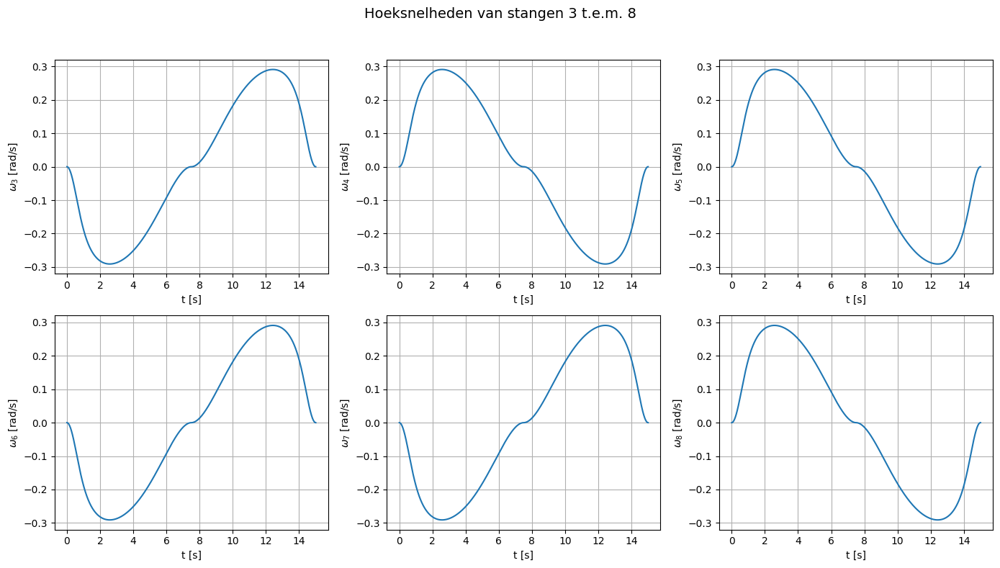

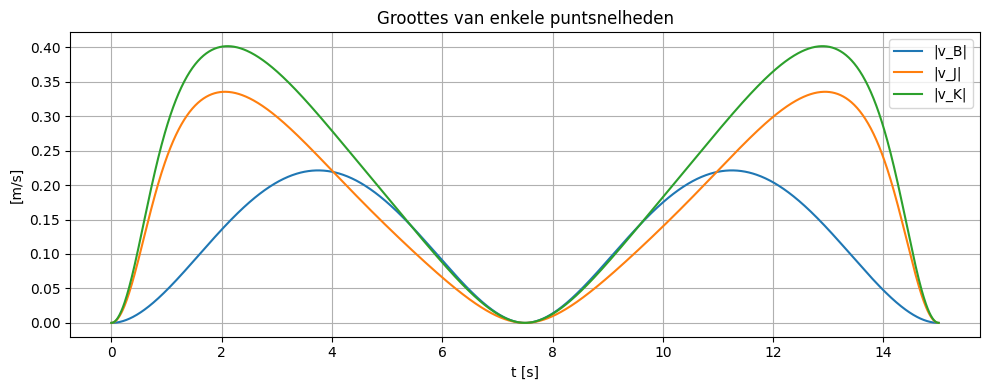

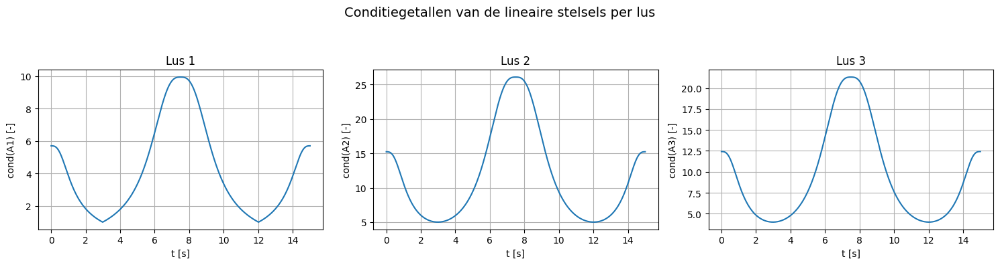

In [353]:
plt.close('all')  # sluit oude figuren eerst

# ── Verificatie en betrouwbaarheid van de snelheidsanalyse ───────────────────

n4_all = np.column_stack((-np.sin(theta4), np.cos(theta4)))
n5_all = np.column_stack((-np.sin(theta5), np.cos(theta5)))
n7_all = np.column_stack((-np.sin(theta7), np.cos(theta7)))
n8_all = np.column_stack((-np.sin(theta8), np.cos(theta8)))

# Controle: zelfde punt via andere tak van de lus
vE_via_4 = L4a * omega4[:, None] * n4_all

vH_via_2 = (
    v_pts['D']
    + L5_total * omega5[:, None] * n5_all
    + L7a      * omega7[:, None] * n7_all
)

vI_via_J = v_pts['J'] - L8a * omega8[:, None] * n8_all

errv1 = np.max(np.linalg.norm(v_pts['E'] - vE_via_4, axis=1))
errv2 = np.max(np.linalg.norm(v_pts['H'] - vH_via_2, axis=1))
errv3 = np.max(np.linalg.norm(v_pts['I'] - vI_via_J, axis=1))

print("Maximale snelheidsfout in de lusvergelijkingen:")
print(f"  Lus 1: {errv1:.2e} m/s")
print(f"  Lus 2: {errv2:.2e} m/s")
print(f"  Lus 3: {errv3:.2e} m/s")

print("\nBetrouwbaarheid van de lineaire stelsels:")
print(f"  max cond(A1) = {cond_v1.max():.2e}")
print(f"  max cond(A2) = {cond_v2.max():.2e}")
print(f"  max cond(A3) = {cond_v3.max():.2e}")

# ── Hoeksnelheden plotten ────────────────────────────────────────────────────

figv, axes = plt.subplots(2, 3, figsize=(14, 8))
figv.suptitle("Hoeksnelheden van stangen 3 t.e.m. 8", fontsize=14)

gegevens_v = [
    (omega3, r'$\omega_3$ [rad/s]'),
    (omega4, r'$\omega_4$ [rad/s]'),
    (omega5, r'$\omega_5$ [rad/s]'),
    (omega6, r'$\omega_6$ [rad/s]'),
    (omega7, r'$\omega_7$ [rad/s]'),
    (omega8, r'$\omega_8$ [rad/s]'),
]

for ax, (data, ylabel) in zip(axes.ravel(), gegevens_v):
    ax.plot(t, data)
    ax.set_xlabel('t [s]')
    ax.set_ylabel(ylabel)
    ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# ── Grootte van enkele puntsnelheden ─────────────────────────────────────────

figp, axp = plt.subplots(figsize=(10, 4))
axp.plot(t, np.linalg.norm(v_pts['B'], axis=1), label='|v_B|')
axp.plot(t, np.linalg.norm(v_pts['J'], axis=1), label='|v_J|')
axp.plot(t, np.linalg.norm(v_pts['K'], axis=1), label='|v_K|')

axp.set_title('Groottes van enkele puntsnelheden')
axp.set_xlabel('t [s]')
axp.set_ylabel('[m/s]')
axp.grid(True)
axp.legend()

plt.tight_layout()
plt.show()

# ── Conditiegetallen van de drie lussen ──────────────────────────────────────

figc, axes = plt.subplots(1, 3, figsize=(15, 4))
figc.suptitle('Conditiegetallen van de lineaire stelsels per lus', fontsize=14)

axes[0].plot(t, cond_v1)
axes[0].set_title('Lus 1')
axes[0].set_ylabel('cond(A1) [-]')
axes[0].grid(True)

axes[1].plot(t, cond_v2)
axes[1].set_title('Lus 2')
axes[1].set_ylabel('cond(A2) [-]')
axes[1].grid(True)

axes[2].plot(t, cond_v3)
axes[2].set_title('Lus 3')
axes[2].set_ylabel('cond(A3) [-]')
axes[2].grid(True)

for ax in axes:
    ax.set_xlabel('t [s]')

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

# Een conditiegetal onder 10 wijst op een goed geconditioneerd lineair stelsel.

In [354]:
# ── Versnellingsanalyse ───────────────────────────────────────────────────────
#voll idem aan snelheidsanalyse, maar nu met de tweede afgeleiden van de lus-sluitingsvergelijkingen,
alpha3 = np.zeros(N) #hoekversnelling van stang 3
alpha4 = np.zeros(N)
alpha5 = np.zeros(N)
alpha6 = np.zeros(N)
alpha7 = np.zeros(N)
alpha8 = np.zeros(N)

cond_a1 = np.zeros(N)
cond_a2 = np.zeros(N)
cond_a3 = np.zeros(N)

aB_all = np.zeros((N, 2)) #lineaire versnelling van B is bekend (aangedreven versnelling), deze slaan we ook op voor de volledigheid, maar deze is al bekend uit de beginvoorwaarden
aD_all = np.zeros((N, 2))
aE_all = np.zeros((N, 2))
aF_all = np.zeros((N, 2))
aG_all = np.zeros((N, 2))
aH_all = np.zeros((N, 2))
aI_all = np.zeros((N, 2))
aJ_all = np.zeros((N, 2))
aK_all = np.zeros((N, 2))

for k in range(N):
    aB = np.array([0.0, ddB_y[k]]) # Versnelling van B is bekend (aangedreven versnelling)

    u3 = unit(theta3[k])
    u4 = unit(theta4[k])
    u5 = unit(theta5[k])
    u6 = unit(theta6[k])
    u7 = unit(theta7[k])
    u8 = unit(theta8[k])
    
    n3 = normal(theta3[k])
    n4 = normal(theta4[k])
    n5 = normal(theta5[k])
    n6 = normal(theta6[k])
    n7 = normal(theta7[k])
    n8 = normal(theta8[k])

    #Sluitingsvergelijkingen in tweede afgeleide vorm opstellen 
    # ── Lus 1 ────────────────────────────────────────────────────────────────
    # a_B + L3_total*(α3*n3 - ω3²*u3) = L4a*(α4*n4 - ω4²*u4)
    A1 = np.column_stack((L3_total * n3, -L4a * n4))
    b1 = -aB + L3_total * omega3[k]**2 * u3 - L4a * omega4[k]**2 * u4
    alpha3[k], alpha4[k] = np.linalg.solve(A1, b1)
    cond_a1[k] = np.linalg.cond(A1)

    aD = aB + L3a      * alpha3[k] * n3 - L3a      * omega3[k]**2 * u3
    aE = aB + L3_total * alpha3[k] * n3 - L3_total * omega3[k]**2 * u3
    aH =      L4_total * alpha4[k] * n4 - L4_total * omega4[k]**2 * u4

    # ── Lus 2 ────────────────────────────────────────────────────────────────
    # a_D + L5_total*(α5*n5 - ω5²*u5) + L7a*(α7*n7 - ω7²*u7) = a_H
    A2 = np.column_stack((L5_total * n5, L7a * n7))
    b2 = aH - aD + L5_total * omega5[k]**2 * u5 + L7a * omega7[k]**2 * u7
    alpha5[k], alpha7[k] = np.linalg.solve(A2, b2)
    cond_a2[k] = np.linalg.cond(A2)

    aF = aD + L5a      * alpha5[k] * n5 - L5a      * omega5[k]**2 * u5
    aG = aD + L5_total * alpha5[k] * n5 - L5_total * omega5[k]**2 * u5
    aJ = aG + L7_total * alpha7[k] * n7 - L7_total * omega7[k]**2 * u7

    # ── Lus 3 ────────────────────────────────────────────────────────────────
    # a_F + L6*(α6*n6 - ω6²*u6) = a_J - L8a*(α8*n8 - ω8²*u8)
    A3 = np.column_stack((L6 * n6, L8a * n8))
    b3 = aJ - aF + L6 * omega6[k]**2 * u6 + L8a * omega8[k]**2 * u8
    alpha6[k], alpha8[k] = np.linalg.solve(A3, b3)
    cond_a3[k] = np.linalg.cond(A3)

    aI = aF + L6       * alpha6[k] * n6 - L6       * omega6[k]**2 * u6
    aK = aI + L8_total * alpha8[k] * n8 - L8_total * omega8[k]**2 * u8
    
    #lineaire versnellingen van alle punten opslaan
    aB_all[k] = aB
    aD_all[k] = aD
    aE_all[k] = aE
    aF_all[k] = aF
    aG_all[k] = aG
    aH_all[k] = aH
    aI_all[k] = aI
    aJ_all[k] = aJ
    aK_all[k] = aK

print("Versnellingsanalyse voltooid.")
for name, arr in [("α₃",alpha3),("α₄",alpha4),("α₅",alpha5),
                  ("α₆",alpha6),("α₇",alpha7),("α₈",alpha8)]:
    print(f"  {name}: [{arr.min():+.3f}, {arr.max():+.3f}] rad/s²")


Versnellingsanalyse voltooid.
  α₃: [-0.251, +0.094] rad/s²
  α₄: [-0.094, +0.251] rad/s²
  α₅: [-0.094, +0.251] rad/s²
  α₆: [-0.251, +0.094] rad/s²
  α₇: [-0.251, +0.094] rad/s²
  α₈: [-0.094, +0.251] rad/s²


Maximale versnellingsfout in de lusvergelijkingen:
  Lus 1: 2.08e-17 m/s²
  Lus 2: 5.55e-17 m/s²
  Lus 3: 5.72e-17 m/s²

Betrouwbaarheid van de lineaire stelsels:
  max cond(A1) = 9.95e+00
  max cond(A2) = 2.61e+01
  max cond(A3) = 2.13e+01


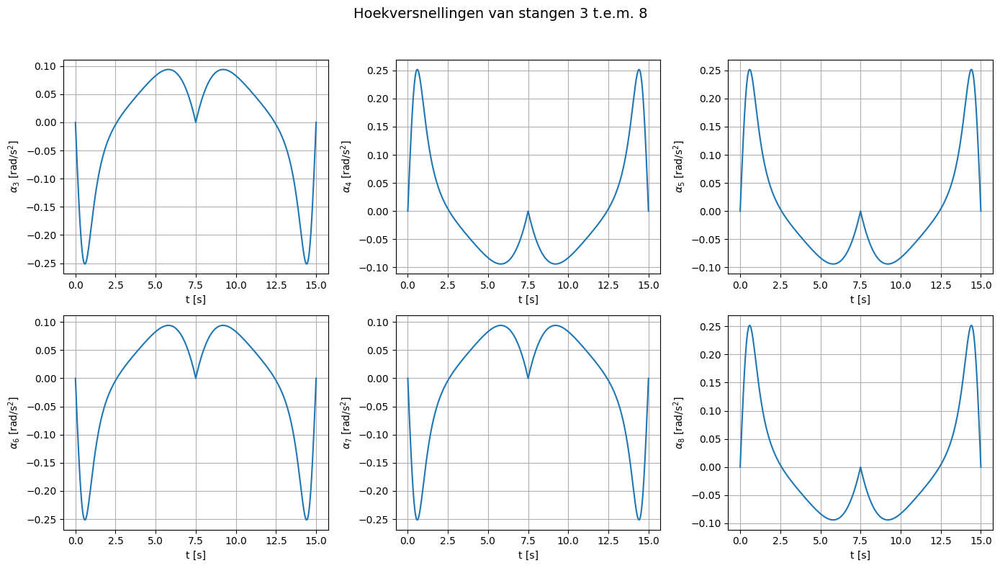

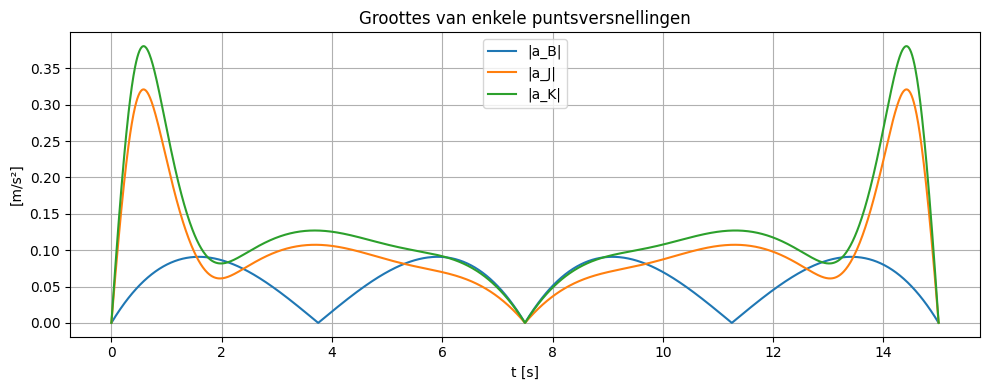

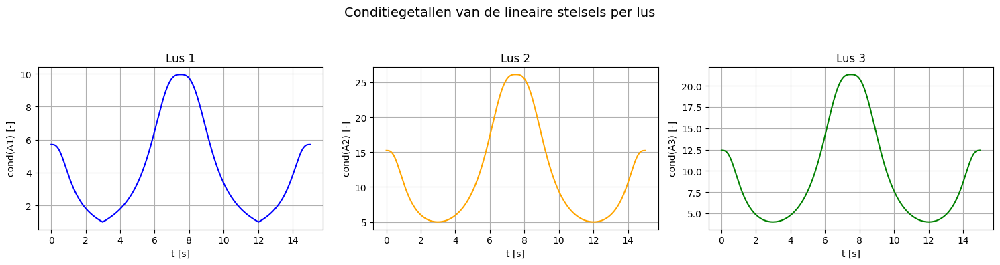

In [355]:
# ── Verificatie en betrouwbaarheid van de versnellingsanalyse ────────────────
plt.close('all')# zorgt dat vorige figuren gesloten worden, zodat we niet te veel figuren hebben openstaan
u4_all = np.column_stack((np.cos(theta4), np.sin(theta4)))
n4_all = np.column_stack((-np.sin(theta4), np.cos(theta4)))

u5_all = np.column_stack((np.cos(theta5), np.sin(theta5)))
n5_all = np.column_stack((-np.sin(theta5), np.cos(theta5)))

u7_all = np.column_stack((np.cos(theta7), np.sin(theta7)))
n7_all = np.column_stack((-np.sin(theta7), np.cos(theta7)))

u8_all = np.column_stack((np.cos(theta8), np.sin(theta8)))
n8_all = np.column_stack((-np.sin(theta8), np.cos(theta8)))

# Controle: zelfde punt, andere tak van de lus
aE_via_4 = L4a * alpha4[:, None] * n4_all - L4a * omega4[:, None]**2 * u4_all
aH_via_2 = aD_all + L5_total * alpha5[:, None] * n5_all - L5_total * omega5[:, None]**2 * u5_all \
                 + L7a      * alpha7[:, None] * n7_all - L7a      * omega7[:, None]**2 * u7_all
aI_via_8 = aJ_all - L8a * alpha8[:, None] * n8_all + L8a * omega8[:, None]**2 * u8_all

erra1 = np.max(np.linalg.norm(aE_all - aE_via_4, axis=1))
erra2 = np.max(np.linalg.norm(aH_all - aH_via_2, axis=1))
erra3 = np.max(np.linalg.norm(aI_all - aI_via_8, axis=1))

print("Maximale versnellingsfout in de lusvergelijkingen:")
print(f"  Lus 1: {erra1:.2e} m/s²")
print(f"  Lus 2: {erra2:.2e} m/s²")
print(f"  Lus 3: {erra3:.2e} m/s²")

print("\nBetrouwbaarheid van de lineaire stelsels:")
print(f"  max cond(A1) = {cond_a1.max():.2e}")
print(f"  max cond(A2) = {cond_a2.max():.2e}")
print(f"  max cond(A3) = {cond_a3.max():.2e}")

# Opmerking:
# De matrices A1, A2 en A3 zijn qua vorm dezelfde als bij de snelheidsanalyse,
# dus de condition numbers zouden in dezelfde grootteorde moeten liggen.

# ── Plots van hoekversnellingen ───────────────────────────────────────────────

figa, axes = plt.subplots(2, 3, figsize=(14, 8))
figa.suptitle("Hoekversnellingen van stangen 3 t.e.m. 8", fontsize=14)

gegevens_a = [
    (alpha3, r'$\alpha_3$ [rad/s$^2$]'),
    (alpha4, r'$\alpha_4$ [rad/s$^2$]'),
    (alpha5, r'$\alpha_5$ [rad/s$^2$]'),
    (alpha6, r'$\alpha_6$ [rad/s$^2$]'),
    (alpha7, r'$\alpha_7$ [rad/s$^2$]'),
    (alpha8, r'$\alpha_8$ [rad/s$^2$]'),
]

for ax, (data, ylabel) in zip(axes.ravel(), gegevens_a):
    ax.plot(t, data)
    ax.set_xlabel('t [s]')
    ax.set_ylabel(ylabel)
    ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# ── Grootte van enkele lineaire versnellingen ────────────────────────────────

figp, axp = plt.subplots(figsize=(10, 4))
axp.plot(t, np.linalg.norm(aB_all, axis=1), label='|a_B|')
axp.plot(t, np.linalg.norm(aJ_all, axis=1), label='|a_J|')
axp.plot(t, np.linalg.norm(aK_all, axis=1), label='|a_K|')
axp.set_title('Groottes van enkele puntsversnellingen')
axp.set_xlabel('t [s]')
axp.set_ylabel('[m/s²]')
axp.grid(True)
axp.legend()

plt.tight_layout()
plt.show()

# ── Conditiegetallen van de drie lussen als subplots ─────────────────────────

figc, axes = plt.subplots(1, 3, figsize=(15, 4))
figc.suptitle('Conditiegetallen van de lineaire stelsels per lus', fontsize=14)

# Lus 1
axes[0].plot(t, cond_a1, color='blue')
axes[0].set_title('Lus 1')
axes[0].set_xlabel('t [s]')
axes[0].set_ylabel('cond(A1) [-]')
axes[0].grid(True)

# Lus 2
axes[1].plot(t, cond_a2, color='orange')
axes[1].set_title('Lus 2')
axes[1].set_xlabel('t [s]')
axes[1].set_ylabel('cond(A2) [-]')
axes[1].grid(True)

# Lus 3
axes[2].plot(t, cond_a3, color='green')
axes[2].set_title('Lus 3')
axes[2].set_xlabel('t [s]')
axes[2].set_ylabel('cond(A3) [-]')
axes[2].grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()

#je hebt hier best grote versnellingsfouten, dit komt waarschijnlijk door de dubbele afgeleiden 
# van de lus-sluitingsvergelijkingen, die bevatten namelijk termen met omega² en alpha,
# en als er al een kleine fout zit in omega of alpha, dan wordt deze fout versterkt in de versnelling. 
# De condition numbers van de matrices zijn ongeveer even groot als bij de snelheidsanalyse, 
# wat wijst op een redelijke betrouwbaarheid.

Maximale absolute fouten voor punt K:
  Positie:      8.48e-12 m
  Snelheid:     7.85e-17 m/s
  Versnelling:  1.11e-16 m/s²

Maximale relatieve fouten voor punt K:
  Positie:      8.48e-12
  Snelheid:     3.02e-16
  Versnelling:  4.11e-16


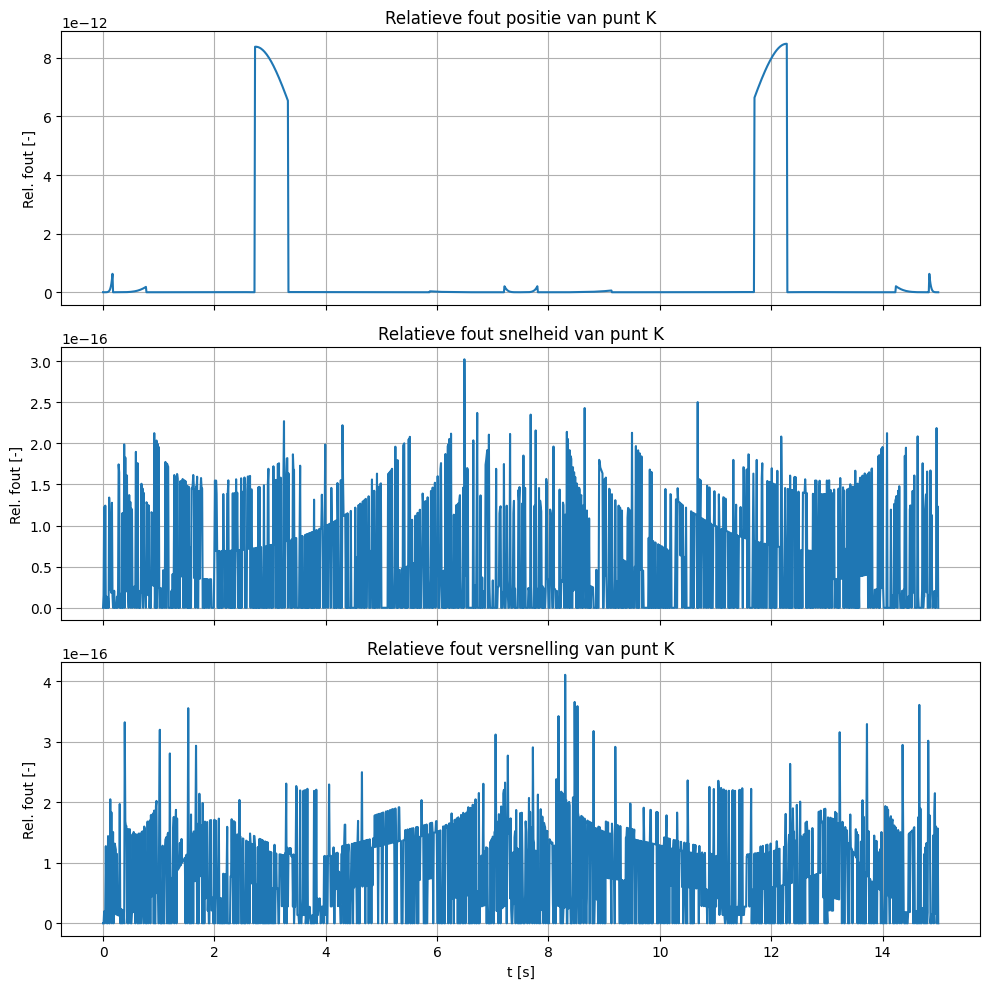

In [356]:
# ── Relatieve fouten (afstand, snelheid, versnelling) voor punt K ─────────────
plt.close('all')
eps = 1e-12
L_ref = max(L3_total, L4_total, L5_total, L6, L7_total, L8_total)

# Eenheids- en normaalvectoren van stang 8
u8_all = np.column_stack([np.cos(theta8), np.sin(theta8)])
n8_all = np.column_stack([-np.sin(theta8), np.cos(theta8)])

# K berekend via punt J en het resterende stuk van stang 8
L8_JK = L8_total - L8a

K_via_J = pts['J'] + L8_JK * u8_all
vK_via_J = v_pts['J'] + L8_JK * omega8[:, None] * n8_all
aK_via_J = (
    aJ_all
    + L8_JK * alpha8[:, None] * n8_all
    - L8_JK * omega8[:, None]**2 * u8_all
)

# POSITIE
abs_fout_pos_K = np.linalg.norm(pts['K'] - K_via_J, axis=1)
rel_fout_pos_K = abs_fout_pos_K / L_ref

# SNELHEID
abs_fout_vel_K = np.linalg.norm(v_pts['K'] - vK_via_J, axis=1)
ref_vel_K = np.linalg.norm(v_pts['K'], axis=1)
rel_fout_vel_K = abs_fout_vel_K / np.maximum(ref_vel_K, eps)

# VERSNELLING
abs_fout_acc_K = np.linalg.norm(aK_all - aK_via_J, axis=1)
ref_acc_K = np.linalg.norm(aK_all, axis=1)
rel_fout_acc_K = abs_fout_acc_K / np.maximum(ref_acc_K, eps)

print("Maximale absolute fouten voor punt K:")
print(f"  Positie:      {np.max(abs_fout_pos_K):.2e} m")
print(f"  Snelheid:     {np.max(abs_fout_vel_K):.2e} m/s")
print(f"  Versnelling:  {np.max(abs_fout_acc_K):.2e} m/s²")

print("\nMaximale relatieve fouten voor punt K:")
print(f"  Positie:      {np.max(rel_fout_pos_K):.2e}")
print(f"  Snelheid:     {np.max(rel_fout_vel_K):.2e}")
print(f"  Versnelling:  {np.max(rel_fout_acc_K):.2e}")

fig, axes = plt.subplots(3, 1, figsize=(10, 10), sharex=True)

axes[0].plot(t, rel_fout_pos_K)
axes[0].set_ylabel('Rel. fout [-]')
axes[0].set_title('Relatieve fout positie van punt K')
axes[0].grid(True)

axes[1].plot(t, rel_fout_vel_K)
axes[1].set_ylabel('Rel. fout [-]')
axes[1].set_title('Relatieve fout snelheid van punt K')
axes[1].grid(True)

axes[2].plot(t, rel_fout_acc_K)
axes[2].set_xlabel('t [s]')
axes[2].set_ylabel('Rel. fout [-]')
axes[2].set_title('Relatieve fout versnelling van punt K')
axes[2].grid(True)

plt.tight_layout()
plt.show()

#De relatieve fouten in positie en snelheid zijn zeer klein, wat wijst op een zeer goede nauwkeurigheid van de numerieke oplossingen, echter die van de versnelling is groter, wat we al hadden opgemerkt, 
#en dit komt waarschijnlijk door de versterking van fouten in de tweede afgeleide van de lus-sluitingsvergelijkingen.

In [357]:
# ── Animatie ──────────────────────────────────────────────────────────────────

plt.ioff()
fig_anim, ax_anim = plt.subplots(figsize=(10, 8))

# Canvas-grenzen bepalen op basis van trajecten
all_x = np.concatenate([pts[n][:, 0] for n in pts] + [[C[0]]])
all_y = np.concatenate([pts[n][:, 1] for n in pts] + [[C[1]],[0.0]])
margin = 0.08 * L1
x_min, x_max = all_x.min() - margin, all_x.max() + margin
y_min, y_max = all_y.min() - margin, all_y.max() + margin

def update(frame):
    global ax_anim
    ax_anim.cla()
    ax_anim.set_aspect('equal')
    ax_anim.set_xlim(x_min, x_max)
    ax_anim.set_ylim(y_min, y_max)
    ax_anim.set_xlabel('[m]')
    ax_anim.set_ylabel('[m]')
    ax_anim.set_title(f'Achtstangen-mechanisme (paraplu)  —  t = {t[frame]:.2f} s')
    ax_anim.grid(True, alpha=0.2)

    # Actuele posities voor dit frame ophalen
    B = pts['B'][frame]
    D = pts['D'][frame]
    E = pts['E'][frame]
    F = pts['F'][frame]
    G = pts['G'][frame]
    H = pts['H'][frame]
    I = pts['I'][frame]
    J = pts['J'][frame]
    K = pts['K'][frame]

    lw, ms = 2.5, 6

    # 1. Schuifbaan (oneindige stippellijn)
    ax_anim.axvline(0, color='gray', lw=1, ls='--', alpha=0.3, zorder=0)

    # 2. FYSIEKE STANG 1 (Van grond [0,0] naar vast punt C)
    ax_anim.plot([0, C[0]], [0, C[1]], color='gray', lw=lw, ms=ms, label='1: Hoofdstang')

    # Schuifblok op B (ring die over stang 1 glijdt)
    sq = 0.035
    rect = plt.Rectangle(
    (B[0] - sq/2, B[1] - sq/2), sq, sq,lw=1.5,edgecolor='steelblue',facecolor='lightblue',zorder=4,label='2:Aandrijver')
    ax_anim.add_patch(rect)

    # Stang 3: B → D → E
    ax_anim.plot([B[0], D[0], E[0]], [B[1], D[1], E[1]],
                 'o-', color='tab:blue', lw=lw, ms=ms, label='3: B–D–E')

    # Stang 4: C → E → H
    ax_anim.plot([C[0], E[0], H[0]], [C[1], E[1], H[1]],
                 'o-', color='tab:orange', lw=lw, ms=ms, label='4: C–E–H')

    # Stang 5: D → F → G
    ax_anim.plot([D[0], F[0], G[0]], [D[1], F[1], G[1]],
                 'o-', color='tab:green', lw=lw, ms=ms, label='5: D–F–G')

    # Stang 6: F → I
    ax_anim.plot([F[0], I[0]], [F[1], I[1]],
                 'o-', color='tab:red', lw=lw, ms=ms, label='6: F–I')

    # Stang 7: G → H → J
    ax_anim.plot([G[0], H[0], J[0]], [G[1], H[1], J[1]],
                 'o-', color='tab:purple', lw=lw, ms=ms, label='7: G–H–J')

    # Stang 8: I → J → K
    ax_anim.plot([I[0], J[0], K[0]], [I[1], J[1], K[1]],
                 'o-', color='tab:brown', lw=lw, ms=ms, label='8: I–J–K')

    # Vast draaipunt C
    ax_anim.plot(*C, 'k^', ms=12, zorder=6)

    # Puntlabels
    off = 0.018
    for lbl, pt in [('B', B), ('C', C), ('D', D), ('E', E),
                    ('F', F), ('G', G), ('H', H), ('I', I),
                    ('J', J), ('K', K)]:
        ax_anim.annotate(lbl, pt, xytext=(pt[0] + off, pt[1] + off),
                         fontsize=9, color='darkred', fontweight='bold', zorder=7)

    # Legende rechtsonder, kleiner lettertype, 2 kolommen voor compactheid
    ax_anim.legend(loc='lower right', fontsize=8, ncol=2, framealpha=0.8)
    
    return ax_anim,

# Animatie-instellingen
step   = max(1, N // 200)
frames = list(range(0, N, step))

ani = FuncAnimation(fig_anim, update, frames=frames, interval=50, blit=False, repeat=True)
plt.tight_layout()
print(f"Animatie gegenereerd: {len(frames)} frames (stap = {step})")

Animatie gegenereerd: 215 frames (stap = 7)


In [358]:
# ── Exporteer animatie als interactieve HTML ───────────────────────────────────

html_output = ani.to_jshtml(fps=20)

# Optioneel opslaan:
# with open('mechanisme8stangen.html', 'w') as f:
#     f.write(html_output)
# print("Opgeslagen als 'mechanisme8stangen.html'")

HTML(html_output)

#DUURT GEMIDDELD 1min10s

# ── Dynamische analyse van het achtstangen-mechanisme ──

Hieronder volgt de dynamische analyse van het mechanisme. We berekenen:
1. De krachten op elke stang via Newton-Euler (18×18 stelsel per tijdstap)
2. De vereiste aandrijfkracht F_B,y aan punt B (de glijder langs de y-as)
3. Verificatie via de **kinetische-energiemethode** (vermogensbalans)
4. De invloed van **wrijving** in de schuifbaan van B
5. Het benodigde **vermogen** aan de aandrijver

**Opmerking over variabelen-mapping (Paraplu → ons mechanisme):**
- `phi_k` → `theta_k` (positie-hoeken)
- `dphi_k` → `omega_k` (hoeksnelheden)
- `ddphi_k` → `alpha_k` (hoekversnellingen)
- `r_..` → `L_..` (staaflengtes)
- In de Paraplu was **A** de glijder; bij ons is dat **B** (langs verticale y-as).
- Het vaste draaipunt **C** is gemeenschappelijk.

In [359]:
# ── Materiaalparameters en geometrie van de stangen ───────────────────────────
# Alle eenheden in SI.

# Dichtheid en geometrie
densityAL     = 2700      # kg/m³  (aluminium rho = 2700, steel rho = 7850)
diameter_uit      = 0.1      # m      (alle stangen hebben dezelfde diameter) ...... Voor paraplu: 0.01
diameter_in      = 0.08     # m      (holle stangen)                          ....... Voor paraplu: 0.008
g             = 0      # m/s²
Cog_parameter = 0.5       # zwaartepunt in het midden van elke stang

#_____Load [N]_________________________________________________________________
Fk_loadx = 0.0 #Gewichtskracht van vliegtuig 50 ton, vooral relevant wanneer wielen volledig uitgeklapt zijn
Fk_loady = 40_000.0 # wind of zoiets, deze kracht is veel kleiner dan de aandrijfkracht, maar zorgt er wel voor dat er een kleine asymmetrie in het mechanisme zit

# ── Hulpfuncties voor kinematica van punten op een stang ─────────────────────
# Equivalent aan next_joint_vel en next_joint_acc uit de Paraplu-code.
# We gebruiken ze om de snelheid/versnelling van het zwaartepunt en interne
# scharnierpunten te bepalen vanuit één eindpunt van de stang.

def next_joint_vel(vA, r, phi, dphi):
    """Snelheid van punt op afstand r langs een stang met hoek phi en hoeksnelheid dphi."""
    vx = vA[0] - r * np.sin(phi) * dphi
    vy = vA[1] + r * np.cos(phi) * dphi
    return np.array([vx, vy])


def next_joint_acc(aA, r, phi, dphi, ddphi):
    """Versnelling van punt op afstand r langs een stang met hoek phi, dphi, ddphi."""
    ax = aA[0] - r * np.cos(phi) * dphi**2 - r * np.sin(phi) * ddphi
    ay = aA[1] - r * np.sin(phi) * dphi**2 + r * np.cos(phi) * ddphi
    return np.array([ax, ay])


def cog_kinematics(valA, valB, Cog_parameter):
    """Lineaire interpolatie tussen beide uiteinden voor het zwaartepunt."""
    return valA * (1 - Cog_parameter) + valB * Cog_parameter


In [360]:
# ── Klasse BarLink: vat alle gegevens van een stang samen ─────────────────────
# Massa, traagheid, zwaartepunt-kinematica, en hulpgrootheden voor het krachten-
# stelsel (afstand van CoG tot scharnierpunten, voor de momentvergelijking).

class BarLink:
    def __init__(self, density, diameter_uit, diameter_in, length,
                 vBegin, vEnd, aBegin, aEnd,
                 Cog_parameter,
                 intern_joint_position=None,
                 angular_velocity=None,
                 angular_acceleration=None):
        self.density               = density            # kg/m³
        self.diameter_uit          = diameter_uit           # m
        self.diameter_in           = diameter_in           # m
        self.length                = length             # m
        self.angular_velocity      = angular_velocity   # rad/s
        self.angular_acceleration  = angular_acceleration  # rad/s²
        self.Cog_parameter         = Cog_parameter      # fractie langs de stang
        self.intern_joint_position = intern_joint_position  # afstand vanaf "begin"

        # Kinematica van het zwaartepunt (lineaire interpolatie tussen uiteinden)
        self.velocity     = cog_kinematics(vBegin, vEnd, self.Cog_parameter)
        self.acceleration = cog_kinematics(aBegin, aEnd, self.Cog_parameter)

    @property
    def cross_sectional_area(self):
        """Oppervlakte van de doorsnede: A = π·r²"""
        outer_radius = self.diameter_uit / 2
        inner_radius = self.diameter_in / 2
        return np.pi * (outer_radius**2 - inner_radius**2)

    @property
    def volume(self):
        """Volume: V = A · L"""
        return self.cross_sectional_area * self.length

    @property
    def mass(self):
        """Massa: m = ρ · V"""
        return self.density * self.volume

    @property
    def distance_Cog_intern_joint(self):
        """Afstand van CoG tot het interne scharnierpunt (positief = rechts van CoG)."""
        return self.intern_joint_position - self.Cog_parameter * self.length

    def distance_Cog_joint(self, joint_number):
        """Afstand van CoG tot uiteinde 1 of 2 (positief = positief moment-arm)."""
        if joint_number == 1:
            return self.Cog_parameter * self.length
        elif joint_number == 2:
            return self.length - self.Cog_parameter * self.length

    @property
    def inertia(self):
        """Traagheidsmoment rond CoG (homogene staaf): I = (1/12)·m·L²"""
        return ((1/12) * self.mass * self.length**2 + 1/2*self.mass * (self.diameter_uit/2)**2)  # inclusief buisvormige correctie


In [361]:
# ── Snelheden en versnellingen van de scharnierpunten als (2, N)-array ─────────
# In de kinematica-secties hierboven zijn al alle scharnierpunten berekend en
# opgeslagen in v_pts[...] (shape (N, 2)) en de aX_all-arrays (shape (N, 2)).
# Voor de dynamica gebruiken we de transponering: (2, N) - vorm.

# Vaste punt C (geen beweging)
vC = np.zeros((2, N))
aC = np.zeros((2, N))

# Glijder B (de aandrijver: beweegt verticaal langs de y-as)
# vB = [0, dB_y], aB = [0, ddB_y]
vB = np.array([np.zeros(N), dB_y])
aB = np.array([np.zeros(N), ddB_y])

# Alle andere punten: uit v_pts en aX_all, getransponeerd naar (2, N)
vD = v_pts['D'].T
aD = aD_all.T
vE = v_pts['E'].T
aE = aE_all.T
vF = v_pts['F'].T
aF = aF_all.T
vG = v_pts['G'].T
aG = aG_all.T
vH = v_pts['H'].T
aH = aH_all.T
vI = v_pts['I'].T
aI = aI_all.T
vJ = v_pts['J'].T
aJ = aJ_all.T
vK = v_pts['K'].T
aK = aK_all.T


# ── Definitie van de zes stangen ──────────────────────────────────────────────
# Mapping van stangen (zelfde topologie als in de Paraplu-code):
#   bar 4 (C–E–H)  ← bar_CH:  van C naar H, intern scharnier E op afstand L4a
#   bar 3 (B–D–E)  ← bar_BE:  van B naar E, intern scharnier D op afstand L3a
#   bar 5 (D–F–G)  ← bar_DG:  van D naar G, intern scharnier F op afstand L5a
#   bar 6 (F–I)    ← bar_FI:  van F naar I, geen intern scharnier
#   bar 7 (G–H–J)  ← bar_GJ:  van G naar J, intern scharnier H op afstand L7a
#   bar 8 (I–J–K)  ← bar_IK:  van I naar K, intern scharnier J op afstand L8a

bar_CH = BarLink(density=densityAL, diameter_uit=diameter_uit, diameter_in=diameter_in,
                 length=L4_total,
                 vBegin=vC, vEnd=vH, aBegin=aC, aEnd=aH,
                 Cog_parameter=Cog_parameter,
                 intern_joint_position=L4a,
                 angular_velocity=omega4, angular_acceleration=alpha4)

bar_BE = BarLink(density=densityAL, diameter_uit=diameter_uit, diameter_in=diameter_in,
                 length=L3_total,
                 vBegin=vB, vEnd=vE, aBegin=aB, aEnd=aE,
                 Cog_parameter=Cog_parameter,
                 intern_joint_position=L3a,
                 angular_velocity=omega3, angular_acceleration=alpha3)

bar_DG = BarLink(density=densityAL, diameter_uit=diameter_uit, diameter_in=diameter_in,
                 length=L5_total,
                 vBegin=vD, vEnd=vG, aBegin=aD, aEnd=aG,
                 Cog_parameter=Cog_parameter,
                 intern_joint_position=L5a,
                 angular_velocity=omega5, angular_acceleration=alpha5)

bar_FI = BarLink(density=densityAL, diameter_uit=diameter_uit, diameter_in=diameter_in,
                 length=L6,
                 vBegin=vF, vEnd=vI, aBegin=aF, aEnd=aI,
                 Cog_parameter=Cog_parameter,
                 angular_velocity=omega6, angular_acceleration=alpha6)

bar_GJ = BarLink(density=densityAL, diameter_uit=diameter_uit, diameter_in=diameter_in,
                 length=L7_total,
                 vBegin=vG, vEnd=vJ, aBegin=aG, aEnd=aJ,
                 Cog_parameter=Cog_parameter,
                 intern_joint_position=L7a,
                 angular_velocity=omega7, angular_acceleration=alpha7)

bar_IK = BarLink(density=densityAL, diameter_uit=diameter_uit, diameter_in=diameter_in,
                 length=L8_total,
                 vBegin=vI, vEnd=vK, aBegin=aI, aEnd=aK,
                 Cog_parameter=Cog_parameter,
                 intern_joint_position=L8a,
                 angular_velocity=omega8, angular_acceleration=alpha8)

print("Stangen gedefinieerd. Massa's [kg]:")
for name, b in [("bar_CH (stang 4)", bar_CH),
                ("bar_BE (stang 3)", bar_BE),
                ("bar_DG (stang 5)", bar_DG),
                ("bar_FI (stang 6)", bar_FI),
                ("bar_GJ (stang 7)", bar_GJ),
                ("bar_IK (stang 8)", bar_IK)]:
    print(f"  {name}: m = {b.mass:.4f} kg,  I = {b.inertia:.2e} kg·m²")


Stangen gedefinieerd. Massa's [kg]:
  bar_CH (stang 4): m = 7.6341 kg,  I = 6.46e-01 kg·m²
  bar_BE (stang 3): m = 3.8170 kg,  I = 8.43e-02 kg·m²
  bar_DG (stang 5): m = 3.8170 kg,  I = 8.43e-02 kg·m²
  bar_FI (stang 6): m = 3.0536 kg,  I = 4.45e-02 kg·m²
  bar_GJ (stang 7): m = 3.0536 kg,  I = 4.45e-02 kg·m²
  bar_IK (stang 8): m = 2.5765 kg,  I = 2.77e-02 kg·m²


In [362]:
# ── Berekening van de reactiekrachten in elk scharnierpunt ────────────────────
# Per tijdstap lossen we een 18×18 lineair stelsel op (3 vergelijkingen × 6
# stangen: ΣFx = m·a_cog,x ; ΣFy = m·a_cog,y + m·g ; ΣM_cog = I·α ).
#
# Onbekenden (18 componenten):
#   x = [F_C_x, F_C_y, F_H_x, F_H_y, F_B_x, F_B_y, F_E_x, F_E_y,
#        F_D_x, F_D_y, F_G_x, F_G_y, F_F_x, F_F_y, F_I_x, F_I_y,
#        F_J_x, F_J_y]
# Hierin is F_B de aandrijfkracht aan punt B (de glijder) — analoog aan F_A in
# de Paraplu-code.

F_C_x = np.zeros_like(t)
F_C_y = np.zeros_like(t)
F_H_x = np.zeros_like(t)
F_H_y = np.zeros_like(t)
F_B_x = np.zeros_like(t)   # aandrijfkracht (was F_A_x in Paraplu)
F_B_y = np.zeros_like(t)   # aandrijfkracht (was F_A_y in Paraplu)
F_E_x = np.zeros_like(t)
F_E_y = np.zeros_like(t)
F_D_x = np.zeros_like(t)
F_D_y = np.zeros_like(t)
F_G_x = np.zeros_like(t)
F_G_y = np.zeros_like(t)
F_F_x = np.zeros_like(t)
F_F_y = np.zeros_like(t)
F_I_x = np.zeros_like(t)
F_I_y = np.zeros_like(t)
F_J_x = np.zeros_like(t)
F_J_y = np.zeros_like(t)

cond4 = np.zeros_like(t)

for k in range(N):
    # Stelselmatrix A (18x18). 
    # met phi_i → theta_i[k] en r_i → L_i.
    A = np.array([
        # ----- Stang CH (= stang 4): ΣFx, ΣFy, ΣM_CoG -----
        [ 1, 0,  1, 0,  0, 0, -1, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0],
        [ 0, 1,  0, 1,  0, 0,  0,-1,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0],
        [ np.sin(theta4[k])*bar_CH.distance_Cog_joint(1),
         -np.cos(theta4[k])*bar_CH.distance_Cog_joint(1),
         -np.sin(theta4[k])*bar_CH.distance_Cog_joint(2),
          np.cos(theta4[k])*bar_CH.distance_Cog_joint(2),
          0, 0,
          np.sin(theta4[k])*bar_CH.distance_Cog_intern_joint,
         -np.cos(theta4[k])*bar_CH.distance_Cog_intern_joint,
          0, 0,  0, 0,  0, 0,  0, 0,  0, 0],

        # ----- Stang BE (= stang 3): ΣFx, ΣFy, ΣM_CoG -----
        [ 0, 0,  0, 0,  1, 0,  1, 0, -1, 0,  0, 0,  0, 0,  0, 0,  0, 0],
        [ 0, 0,  0, 0,  0, 1,  0, 1,  0,-1,  0, 0,  0, 0,  0, 0,  0, 0],
        [ 0, 0,  0, 0,
          np.sin(theta3[k])*bar_BE.distance_Cog_joint(1),
         -np.cos(theta3[k])*bar_BE.distance_Cog_joint(1),
         -np.sin(theta3[k])*bar_BE.distance_Cog_joint(2),
          np.cos(theta3[k])*bar_BE.distance_Cog_joint(2),
          np.sin(theta3[k])*bar_BE.distance_Cog_intern_joint,
         -np.cos(theta3[k])*bar_BE.distance_Cog_intern_joint,
          0, 0,  0, 0,  0, 0,  0, 0],

        # ----- Stang DG (= stang 5): ΣFx, ΣFy, ΣM_CoG -----
        [ 0, 0,  0, 0,  0, 0,  0, 0,  1, 0,  1, 0, -1, 0,  0, 0,  0, 0],
        [ 0, 0,  0, 0,  0, 0,  0, 0,  0, 1,  0, 1,  0,-1,  0, 0,  0, 0],
        [ 0, 0,  0, 0,  0, 0,  0, 0,
          np.sin(theta5[k])*bar_DG.distance_Cog_joint(1),
         -np.cos(theta5[k])*bar_DG.distance_Cog_joint(1),
         -np.sin(theta5[k])*bar_DG.distance_Cog_joint(2),
          np.cos(theta5[k])*bar_DG.distance_Cog_joint(2),
          np.sin(theta5[k])*bar_DG.distance_Cog_intern_joint,
         -np.cos(theta5[k])*bar_DG.distance_Cog_intern_joint,
          0, 0,  0, 0],

        # ----- Stang FI (= stang 6): ΣFx, ΣFy, ΣM_CoG -----
        [ 0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  1, 0,  1, 0,  0, 0],
        [ 0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 1,  0, 1,  0, 0],
        [ 0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0,
          np.sin(theta6[k])*bar_FI.distance_Cog_joint(1),
         -np.cos(theta6[k])*bar_FI.distance_Cog_joint(1),
         -np.sin(theta6[k])*bar_FI.distance_Cog_joint(2),
          np.cos(theta6[k])*bar_FI.distance_Cog_joint(2),
          0, 0],

        # ----- Stang GJ (= stang 7): ΣFx, ΣFy, ΣM_CoG -----
        [ 0, 0, -1, 0,  0, 0,  0, 0,  0, 0, -1, 0,  0, 0,  0, 0,  1, 0],
        [ 0, 0,  0,-1,  0, 0,  0, 0,  0, 0,  0,-1,  0, 0,  0, 0,  0, 1],
        [ 0, 0,
          np.sin(theta7[k])*bar_GJ.distance_Cog_intern_joint,
         -np.cos(theta7[k])*bar_GJ.distance_Cog_intern_joint,
          0, 0,  0, 0,  0, 0,
         -np.sin(theta7[k])*bar_GJ.distance_Cog_joint(1),
          np.cos(theta7[k])*bar_GJ.distance_Cog_joint(1),
          0, 0,  0, 0,
         -np.sin(theta7[k])*bar_GJ.distance_Cog_joint(2),
          np.cos(theta7[k])*bar_GJ.distance_Cog_joint(2)],

        # ----- Stang IK (= stang 8): ΣFx, ΣFy, ΣM_CoG -----
        [ 0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0, -1, 0, -1, 0],
        [ 0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0,-1,  0,-1],
        [ 0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0,  0, 0,
         -np.sin(theta8[k])*bar_IK.distance_Cog_joint(1),
          np.cos(theta8[k])*bar_IK.distance_Cog_joint(1),
          np.sin(theta8[k])*bar_IK.distance_Cog_intern_joint,
         -np.cos(theta8[k])*bar_IK.distance_Cog_intern_joint],
    ])

    cond4[k] = np.linalg.cond(A)

    # Rechterlid B: m·a_cog en m·g, traagheidsmomenten I·α
    Bvec = np.array([
        bar_CH.mass * bar_CH.acceleration[0][k],
        bar_CH.mass * bar_CH.acceleration[1][k] + bar_CH.mass * g,
        bar_CH.inertia * alpha4[k],

        bar_BE.mass * bar_BE.acceleration[0][k],
        bar_BE.mass * bar_BE.acceleration[1][k] + bar_BE.mass * g,
        bar_BE.inertia * alpha3[k],

        bar_DG.mass * bar_DG.acceleration[0][k],
        bar_DG.mass * bar_DG.acceleration[1][k] + bar_DG.mass * g,
        bar_DG.inertia * alpha5[k],

        bar_FI.mass * bar_FI.acceleration[0][k],
        bar_FI.mass * bar_FI.acceleration[1][k] + bar_FI.mass * g,
        bar_FI.inertia * alpha6[k],

        bar_GJ.mass * bar_GJ.acceleration[0][k],
        bar_GJ.mass * bar_GJ.acceleration[1][k] + bar_GJ.mass * g,
        bar_GJ.inertia * alpha7[k],

        bar_IK.mass * bar_IK.acceleration[0][k] + Fk_loadx,
        bar_IK.mass * bar_IK.acceleration[1][k] + bar_IK.mass * g + Fk_loady,
        bar_IK.inertia * alpha8[k],
    ])

    # Least-squares oplossing (robuust tegen lichte numerieke fouten)
    x = np.linalg.lstsq(A, Bvec, rcond=None)[0]

    F_C_x[k] = x[0]
    F_C_y[k] = x[1]
    F_H_x[k] = x[2]
    F_H_y[k] = x[3]
    F_B_x[k] = x[4]
    F_B_y[k] = x[5]
    F_E_x[k] = x[6]
    F_E_y[k] = x[7]
    F_D_x[k] = x[8]
    F_D_y[k] = x[9]
    F_G_x[k] = x[10]
    F_G_y[k] = x[11]
    F_F_x[k] = x[12]
    F_F_y[k] = x[13]
    F_I_x[k] = x[14]
    F_I_y[k] = x[15]
    F_J_x[k] = x[16]
    F_J_y[k] = x[17]

print("Krachtenanalyse voltooid.")
print(f"  max cond(A) = {cond4.max():.2e}")
print(f"  F_B,y bereik: [{F_B_y.min():+.2f}, {F_B_y.max():+.2f}] N")
print(f"  F_C,y bereik: [{F_C_y.min():+.2f}, {F_C_y.max():+.2f}] N")


Krachtenanalyse voltooid.
  max cond(A) = 3.19e+02
  F_B,y bereik: [+30748.68, +30771.42] N
  F_C,y bereik: [+9229.47, +9251.34] N


Totale massa per rib: 23.952 kg
Totale massa voor 8 ribben: 191.62 kg


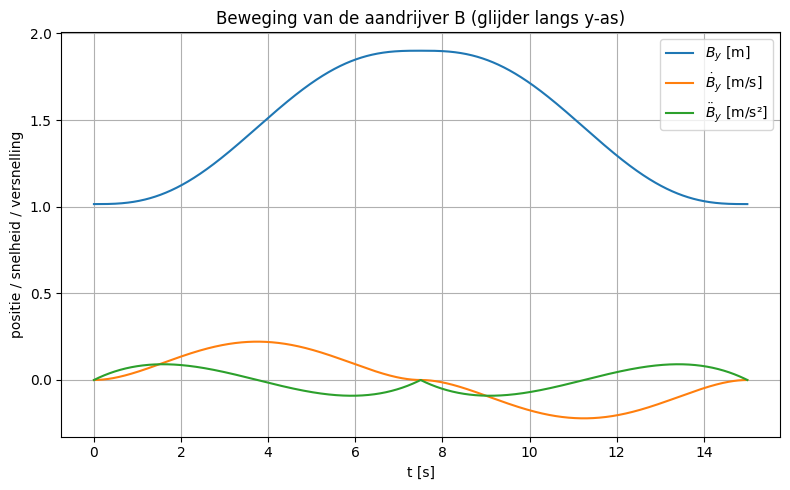

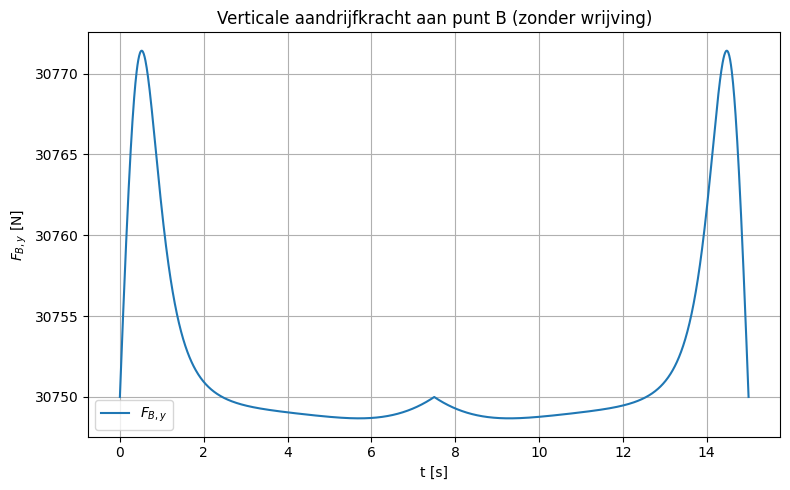


Gemiddelde verticale aandrijfkracht F_B,y over de eerste 7.5 s: +30752.08 N (per rib)
Equivalent gewicht voor 6 ribben: +inf kg


C:\Users\Antoi\AppData\Local\Temp\ipykernel_25348\1615010951.py:43: RuntimeWarning: divide by zero encountered in scalar divide
  print(f"Equivalent gewicht voor 6 ribben: {avg_F_B_y*6/g:+.2f} kg")


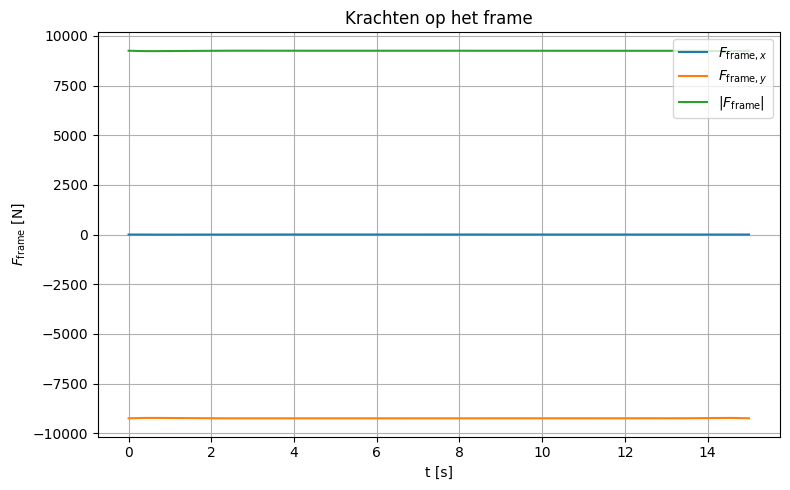

In [363]:
# ── Plot van de krachten ──────────────────────────────────────────────────────
plt.close('all')

# Totale massa van het mechanisme (één rib)
total_mass = (
    bar_CH.mass + bar_BE.mass + bar_DG.mass +
    bar_FI.mass + bar_GJ.mass + bar_IK.mass
)
print(f"Totale massa per rib: {total_mass:.3f} kg")
print(f"Totale massa voor 8 ribben: {8*total_mass:.2f} kg")

figsize = (8, 5)

# 1. Beweging van de glijder B (de aandrijver)
plt.figure(figsize=figsize)
plt.plot(t, B_y,  label=r'$B_y$ [m]')
plt.plot(t, dB_y, label=r'$\dot B_y$ [m/s]')
plt.plot(t, ddB_y,label=r'$\ddot B_y$ [m/s²]')
plt.xlabel('t [s]')
plt.ylabel('positie / snelheid / versnelling')
plt.title('Beweging van de aandrijver B (glijder langs y-as)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 2. Verticale aandrijfkracht aan B
plt.figure(figsize=figsize)
plt.plot(t, F_B_y, label=r'$F_{B,y}$')
plt.xlabel('t [s]')
plt.ylabel(r'$F_{B,y}$ [N]')
plt.title('Verticale aandrijfkracht aan punt B (zonder wrijving)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Gemiddelde aandrijfkracht over de eerste 3 s (= 0.15·T = 60 stappen bij Ts=0.05)
n_avg = int(np.floor(T_half / Ts))
avg_F_B_y = np.mean(F_B_y[:n_avg])
print(f"\nGemiddelde verticale aandrijfkracht F_B,y over de eerste {T_half} s: "
      f"{avg_F_B_y:+.2f} N (per rib)")
print(f"Equivalent gewicht voor 6 ribben: {avg_F_B_y*6/g:+.2f} kg")

# 3. Krachten op het frame (op punten C en B)
F_frame_x = -F_B_x - F_C_x
F_frame_y = -F_C_y          # F_B,y is verticaal en wordt extern opgebracht
F_frame   = np.sqrt(F_frame_x**2 + F_frame_y**2)

plt.figure(figsize=figsize)
plt.plot(t, F_frame_x, label=r'$F_{\mathrm{frame},x}$')
plt.plot(t, F_frame_y, label=r'$F_{\mathrm{frame},y}$')
plt.plot(t, F_frame,   label=r'$|F_{\mathrm{frame}}|$')
plt.xlabel('t [s]')
plt.ylabel(r'$F_{\mathrm{frame}}$ [N]')
plt.title('Krachten op het frame')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


<>:38: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\m'
<>:38: SyntaxWarning: invalid escape sequence '\m'
<>:51: SyntaxWarning: invalid escape sequence '\m'
C:\Users\Antoi\AppData\Local\Temp\ipykernel_25348\3408360696.py:38: SyntaxWarning: invalid escape sequence '\m'
  plt.plot(t, F_B_y_energ, label=r'$F_{B,y,\mathrm{energ}}$')
C:\Users\Antoi\AppData\Local\Temp\ipykernel_25348\3408360696.py:51: SyntaxWarning: invalid escape sequence '\m'
  plt.plot(t, F_B_y - F_B_y_energ, label=r'$F_{B,y} - F_{B,y,\mathrm{energ}}$')


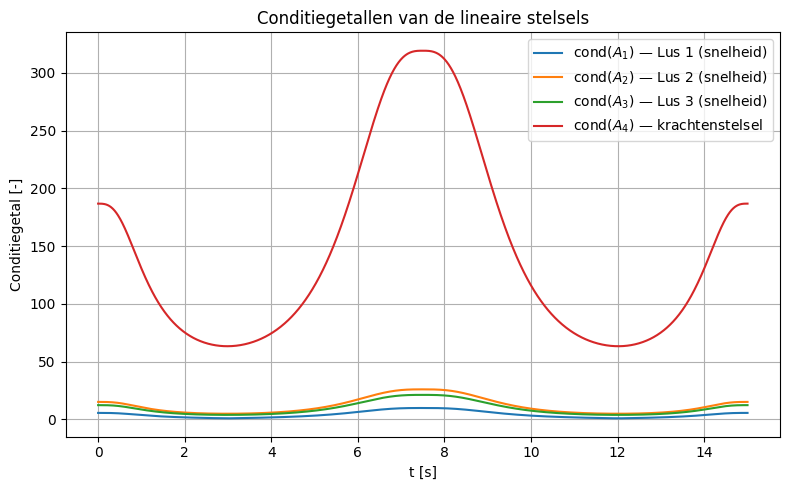

Max |ΔF_B,y|  = 3.075e+04 N
Gem. |ΔF_B,y| = 3.075e+04 N
Max cond(A) krachtenstelsel = 3.19e+02


In [364]:
# ── Verificatie via de kinetische-energiemethode (vermogensbalans) ────────────
#
# Het vermogen dat de aandrijver moet leveren is gelijk aan de tijdsafgeleide
# van de totale (kinetische + potentiële) energie van het systeem:
#
#    F_B,y · v_B,y  =  dE/dt
#
# met v_B,y = dB_y. Hieruit volgt een onafhankelijke schatting van F_B,y:
#
#    F_B,y_energ  =  dE/dt  /  dB_y
#
# Dit moet (op numerieke fouten na) gelijk zijn aan de F_B,y die we via het
# Newton-Euler-stelsel berekend hebben.

all_bars = [bar_CH, bar_BE, bar_DG, bar_FI, bar_GJ, bar_IK]

dEdt = np.zeros_like(t)
for bar in all_bars:
    dEdt += (
        bar.mass * (bar.velocity[0] * bar.acceleration[0]
                  + bar.velocity[1] * bar.acceleration[1])
      + bar.inertia * bar.angular_velocity * bar.angular_acceleration
      + bar.mass * g * bar.velocity[1]
    )

F_B_y_energ = np.zeros_like(t)
for k in range(N):
    if abs(dB_y[k]) < 1e-6:
        F_B_y_energ[k] = np.nan   # bij stilstand niet gedefinieerd
    else:
        F_B_y_energ[k] = dEdt[k] / dB_y[k]

plt.close('all')

"""
# 1. Aandrijfkracht volgens energiemethode
plt.figure(figsize=figsize)
plt.plot(t, F_B_y_energ, label=r'$F_{B,y,\mathrm{energ}}$')
plt.xlabel('t [s]')
plt.ylabel(r'$F_{B,y,\mathrm{energ}}$ [N]')
plt.title('Verticale aandrijfkracht F_B,y via energiemethode')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()
"""

"""
# 2. Verschil tussen beide methodes
plt.figure(figsize=figsize)
plt.plot(t, F_B_y - F_B_y_energ, label=r'$F_{B,y} - F_{B,y,\mathrm{energ}}$')
plt.xlabel('t [s]')
plt.ylabel(r'$\Delta F_{B,y}$ [N]')
plt.title('Verschil Newton-Euler vs. energiemethode')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()
"""

# 3. Conditiegetallen van alle stelsels (kinematica + dynamica)
plt.figure(figsize=figsize)
plt.plot(t, cond_v1, label=r'cond$(A_1)$ — Lus 1 (snelheid)')
plt.plot(t, cond_v2, label=r'cond$(A_2)$ — Lus 2 (snelheid)')
plt.plot(t, cond_v3, label=r'cond$(A_3)$ — Lus 3 (snelheid)')
plt.plot(t, cond4,   label=r'cond$(A_4)$ — krachtenstelsel')
plt.xlabel('t [s]')
plt.ylabel('Conditiegetal [-]')
plt.title('Conditiegetallen van de lineaire stelsels')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Statistieken van het verschil
mask = ~np.isnan(F_B_y_energ)
diff = F_B_y[mask] - F_B_y_energ[mask]
print(f"Max |ΔF_B,y|  = {np.max(np.abs(diff)):.3e} N")
print(f"Gem. |ΔF_B,y| = {np.mean(np.abs(diff)):.3e} N")
print(f"Max cond(A) krachtenstelsel = {cond4.max():.2e}")


Gemiddelde verticale aandrijfkracht (met wrijving) over 7.5 s: +56190.52 N (per rib)
Equivalent gewicht voor 8 ribben: +inf kg


C:\Users\Antoi\AppData\Local\Temp\ipykernel_25348\2026046614.py:21: RuntimeWarning: divide by zero encountered in scalar divide
  f"{avg_F_B_y_friction*8/g:+.2f} kg")


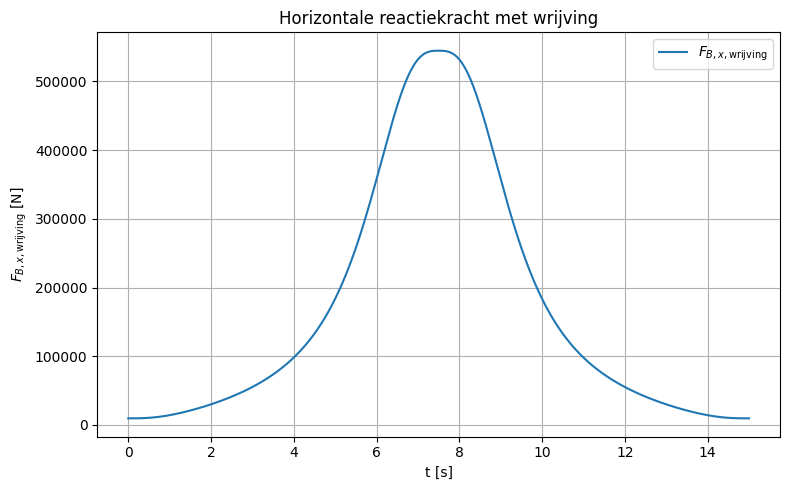

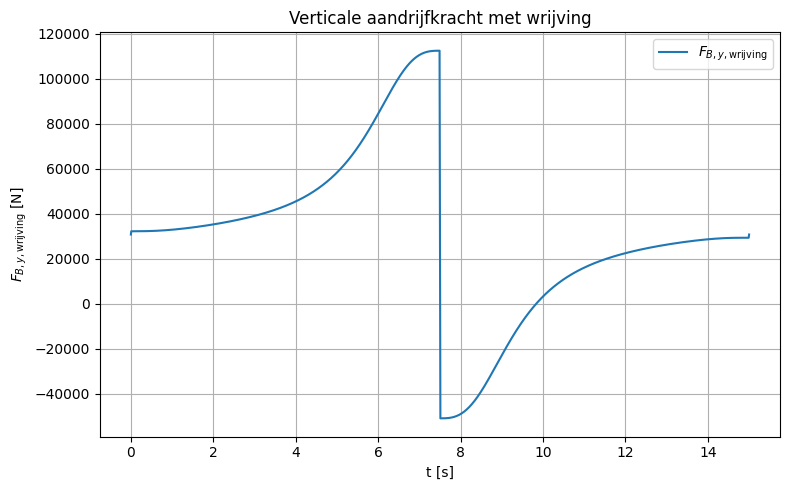

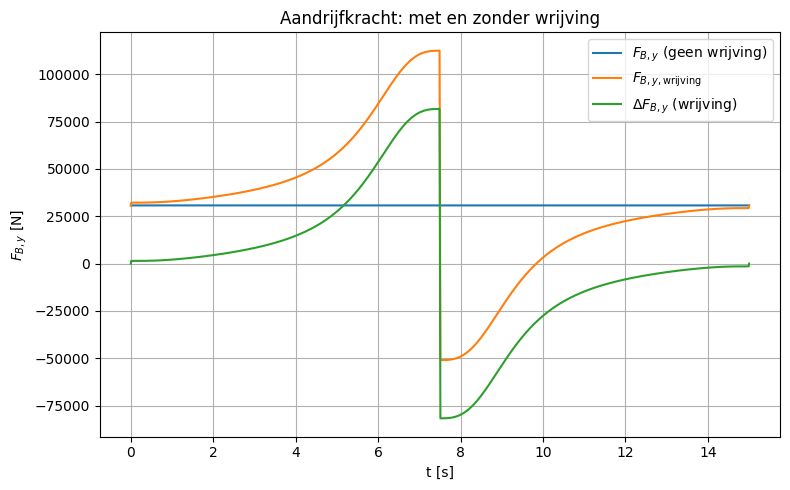

In [365]:
# ── Wrijving in de schuifbaan van punt B ──────────────────────────────────────
#
# De glijder B beweegt langs een verticale geleiding. De normaalkracht op die
# geleiding is de horizontale kracht F_B,x (loodrecht op de bewegingsrichting).
# De wrijvingskracht werkt tegengesteld aan de bewegingsrichting van B en
# bedraagt:   F_wrijving = μ · |F_B,x| · sign(v_B,y)
#
# De totale benodigde aandrijfkracht wordt dan:
#    F_B,y,wrijving = F_B,y + μ · |F_B,x| · sign(v_B,y)

mu = 0.15   # wrijvingscoëfficient (vb. Iglidur 200J polymeer-glijlager op metaal)

F_B_y_friction = F_B_y + mu * np.abs(F_B_x) * np.sign(dB_y)

n_avg = int(np.floor(T_half / Ts))
avg_F_B_y_friction = np.mean(F_B_y_friction[:n_avg])

print(f"Gemiddelde verticale aandrijfkracht (met wrijving) over {T_half} s: "
      f"{avg_F_B_y_friction:+.2f} N (per rib)")
print(f"Equivalent gewicht voor 8 ribben: "
      f"{avg_F_B_y_friction*8/g:+.2f} kg")

plt.close('all')

# Horizontale reactiekracht op de glijder (die de wrijving veroorzaakt)
plt.figure(figsize=figsize)
plt.plot(t, F_B_x, label=r'$F_{B,x,\mathrm{wrijving}}$')
plt.xlabel('t [s]')
plt.ylabel(r'$F_{B,x,\mathrm{wrijving}}$ [N]')
plt.title('Horizontale reactiekracht met wrijving')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


# 1. Aandrijfkracht met wrijving
plt.figure(figsize=figsize)
plt.plot(t, F_B_y_friction, label=r'$F_{B,y,\mathrm{wrijving}}$')
plt.xlabel('t [s]')
plt.ylabel(r'$F_{B,y,\mathrm{wrijving}}$ [N]')
plt.title('Verticale aandrijfkracht met wrijving')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 2. Vergelijking met en zonder wrijving
plt.figure(figsize=figsize)
plt.plot(t, F_B_y,           label=r'$F_{B,y}$ (geen wrijving)')
plt.plot(t, F_B_y_friction,  label=r'$F_{B,y,\mathrm{wrijving}}$')
plt.plot(t, F_B_y_friction - F_B_y, label=r'$\Delta F_{B,y}$ (wrijving)')
plt.xlabel('t [s]')
plt.ylabel(r'$F_{B,y}$ [N]')
plt.title('Aandrijfkracht: met en zonder wrijving')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


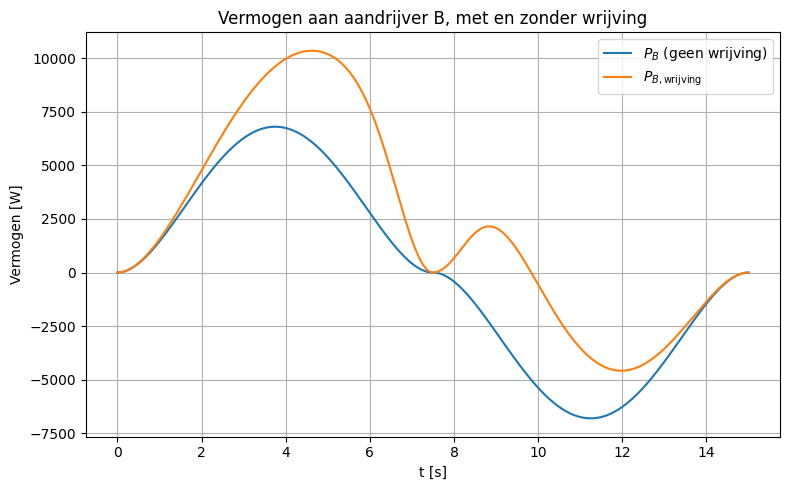

Gemiddeld vermogen aan B over 7.5 s (geen wrijving):  +3628.500 W per rib  |  +29028.00 W voor 8 ribben
Gemiddeld vermogen aan B over 7.5 s (met wrijving):    +5814.623 W per rib  |  +46516.99 W voor 8 ribben

Benodigde spierenergie voor opwaartse beweging: 41.6919 kcal per rib  |  333.535 kcal voor 8 ribben


In [366]:
# ── Benodigd vermogen aan de aandrijver B ────────────────────────────────────
#
# Het ogenblikkelijk vermogen is P = F · v.
# Voor de glijder B met snelheid v_B = (0, dB_y) en aandrijfkracht F_B,y:
#    P_B = F_B,y · dB_y

Power_B          = F_B_y          * dB_y
Power_B_friction = F_B_y_friction * dB_y

plt.close('all')

# 1. Vermogensverloop
plt.figure(figsize=figsize)
plt.plot(t, Power_B,          label=r'$P_B$ (geen wrijving)')
plt.plot(t, Power_B_friction, label=r'$P_{B,\mathrm{wrijving}}$')
plt.xlabel('t [s]')
plt.ylabel('Vermogen [W]')
plt.title('Vermogen aan aandrijver B, met en zonder wrijving')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 2. Gemiddeld vermogen over de eerste T_half s
n_avg = int(np.floor(T_half / Ts))
avg_Power_B          = np.mean(Power_B[:n_avg])
avg_Power_B_friction = np.mean(Power_B_friction[:n_avg])

print(f"Gemiddeld vermogen aan B over {T_half} s (geen wrijving):  "
      f"{avg_Power_B:+.3f} W per rib  |  {avg_Power_B*8:+.2f} W voor 8 ribben")
print(f"Gemiddeld vermogen aan B over {T_half} s (met wrijving):    "
      f"{avg_Power_B_friction:+.3f} W per rib  |  {avg_Power_B_friction*8:+.2f} W voor 8 ribben")

# 3. Energie en menselijke spierenergie-equivalent
meta_eff      = 0.25                        # rendement van motor
Energy_B      = avg_Power_B_friction * T_half  # J (gemiddeld vermogen × T_half s, (tijd voor een héén slag))
Energy_B_kcal = Energy_B / (4184 * meta_eff)

print(f"\nBenodigde spierenergie voor opwaartse beweging: "
      f"{Energy_B_kcal:.4f} kcal per rib  |  "
      f"{Energy_B_kcal*8:.3f} kcal voor 8 ribben")


## Samenvatting van de dynamische analyse

De dynamische analyse berekent de krachten in elk scharnierpunt door per tijdstap een 18×18 Newton-Euler-stelsel op te lossen (3 vergelijkingen per stang × 6 stangen). De **verticale aandrijfkracht F_B,y** is de kracht die de gebruiker (of een actuator) aan de glijder B moet uitoefenen om de voorgeschreven 5de graads beweging te realiseren.

De **kinetische-energiemethode** dient als onafhankelijke verificatie: het vermogensbalans F_B,y · dB_y = dE/dt geeft, na delen door dB_y, een alternatieve schatting van F_B,y. Het verschil tussen beide methodes is een goede indicator voor numerieke nauwkeurigheid (verwacht: zeer klein, behalve in de buurt van keerpunten waar dB_y ≈ 0).

Met een **wrijvingscoëfficient μ = 0.15** (representatief voor een Iglidur-polymeerlager op metaal) is de extra wrijvingsbijdrage F_wrijving = μ·|F_B,x|·sign(dB_y), waarbij F_B,x de horizontale reactie in het schuifblok is.

Het **gemiddelde vermogen** en de **totale energie** over de eerste 3 s laten toe het mechanisme te dimensioneren voor een handmatige bediening of voor een geschikte actuator.

EXTRA OPMERKINGEN: 

Hoofdstang kan je zien als deel van de grond als je veronderstelt dat die niet beweegt, waardoor n=8.

A is een prismatische joint (zie les 1B figuren over kinematische paren), wat een f_1 is, ik weet wel niet hoe je dit moet voorsellen op de figuur of hoe je deze moet animeren/berekenen

alle f_1-gewrichtenn zijn van A tot (en niet met, want geen verbindingsstuk tussen 2 stangen, dus officieel geen joint) K, wat tot f_1=10 zorgt, L behoort ook niet tot f_1 als je de hoofdstang ziet als deel van de grond, want je kan geen gewricht hebben tussen 2 delen van dezelfde stang (namelijk de grond)

Dit leidt tot M = 3( 8 - 1 ) - 2 * 10 - 0 = 1 , 

met geen f_2 omdat je in het mechannisme geen lijncontact of puntcontact hebt tussen twee links. Aangezien het schuifblok via oppervlak-op-oppervlak contact langs de geleider beweegt, wordt deze koppeling beschouwd als een lagere joint (f_1).

Tijdens de les wordt er ook nog gezegd dat het aantal vrijheidsgraden niet rechtstreeks overeenkomt met het aantal actuatoren dat je hebt, omdat ook de zwaartekracht kan dienen als hulpmiddel voor je mechanisme. Bij ons kan dit helpen en tegenwerken, hetzelfde met wrijving. 

Merk op dat bij de animatie van les 2 het lijkt alsof het door een dood punt gaat (stang 1 en 2 vormen een rechte lijn) maar dat is niet zo, het komt gewoon door je manier van animeren, je moet dat dan zeggen hoe je het hebt geanimeerd waardoor ze niet denken dat je tot een dood punt hebt terechtgekomen. Ook moet je bijvoorbeeld duiden waar de aandrijver ligt, bij verwisseling van de aandrijver kan je duiden dat het geometrisch traject alleszins niet zal veranderen, wel de timing en mss kan dat een ramp  zijn voor jouw applicatie.

PARAPLU: de motor staat daar omdat de mens daar aankan en daar ook het meest efficient is om het vermogen over te dragen



Een vraag over een vliegwiel krijg je 100%.

We moeten ons afvragen wat er zou gebeuren als de motor verplaatst wordt of als er ipv 1 motor meerdere op verschillende plaatsne staan, ook staat de motor in de animatie daar omdat de mens daar aankan en daar ook het meest efficient is om het vermogen over te dragen. Ook moeten we ons afvragen wat er zou gebeuren als er de paraplu te maken heeft met hevige zijwind ofz. 

Ook mss afvragen wat er van applicatie is voor het mechanisme als je overal een motor plaatst erop behalve op de huidige plaats.

Er kan ook gevraagd worden wat er bij aanpassing van het mechanimse (nok weg of dergelijke) zal gebeuren, wat is bijvoorbeeld de mobiliteit

Ook vragne ivm de meettoestellen; welke (voor krachten en positieparameters) en waar en hoe nauwkeurig en waarom die toestellen, afhankeljk van de grootte van de nauwkeurigheid? Ook moet je afvragen waar je het best sensoren zet om te weten of je mechanisme nog zijn werk doet. 

Er wordt ook aagneraden om de krachtenanalyse uit toe voeren op twee methodes, is daarmee inverse dynamica en analyse mbv energiemethodes(zie vb van vorig jaar) voldoende?


Na het bepalen van het aandrijfkoppel voor de motor moeten we vanuit zijn maximale waarde en de gemiddelde waarde van het vermogen de keuze voor de motor en het vliegweil maken. Dit wordt ook bepaald door de kostrpijs, energieverbruik en de toegstane grootte van het vliegwiel (met telkens hun trade-offs). Ook het feit dat je moglijks direct in regimetoestand moet zijn met je applicatie (zie les 1, min 31), wrs niet van toepassing bij paraplu

Bij de paraplu kunnen we het vliegwiel op de motoras toevoegen, maar deze zal niet extreem groot mogen zijn omdat dit nog in de slider (stang 2) moet passen. Je kan natuurlijk wel nog de slider vergroten, maar dan laat je snel het gewicht stijgen, wat mogelijks voor extra onbalans kan zorgen. Zie les 4,min20, waarbij extra massa toevoegen op het mechanisme zelf tot versterking van de onbalans zorgt. Je kan indien nodig een vliegwiel met hoge dichtheid nemen, maar mogelijks hoge kostprijs. Ook werd vermeld dat een toepassing waar een niet veel repetitieve beweging is het niet zo nuttig is om een vliegwiel te hebben omdat de gerecupereerde energie niet steeds opnieuw veel achter elkaar gebruikt wordt, dus voor een paraplu is dit niet zo nuttig. Echter geldt wel als de bewegiing van de motor te traag is dat de inertie in de beweging niet grootste factor is maar de wrijving, dan moet je geen vliegwiel toevoegne

Met het toevoegen van een vliegwiel kan je de gewenste fluctuatie K voorspellen omdat je hebt kunnen starten vanuit die K (zie les 4 maximale arbeidssurplus bij K) en de berekening checkt enkel of je geen fouten hebt gemaakt

Er kan gevraagd worden bij de krachtenanalyse wat de onbalanskrachten (krachten op de frame, grootte, frequentie enz) zijn, daarvoor moet je naar de plots kijken, ook voor andere vragen moet je naar de plots kijken. Ook moet je kijken naar de berkeningen en zien of zwaartekracht en wrijving verwaarloosd zijn of niet. Zwaartekracht moet je mee uitrekenen en wrijving zal gevraagd worden, maar moet niet meegerekend worden, gewoon schatten (zwrtkrctht en wr moeten beide maar op 1 van de 2), bij nokken of mechanisme kan dit laatste gebeuren, de plaats is enkel belangrijk, de µ mag je gwn kiezen (min 19 les 6) OOK het vliegwiel moet maar op 1 van de 2 staan

Bij de toepassing voor het mechanisme en nokken moet je de toleranties van je beweging zelf vermelden, ook naar de zachtheid (continuiteit) van je profiel